In [110]:
import pandas as pd
import datetime
from dateutil.parser import parse
import matplotlib.pyplot as plt
import numpy as np
from datetime import date
from datetime import datetime
import seaborn as sns
from sklearn import metrics
import plotly.express as px
import plotly.graph_objects as go
from time import time
#import plotly.express as px
import plotly.graph_objects as go
from collections import Counter
import plotly as py
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
import gower
from sklearn.cluster import DBSCAN
from kmodes.kprototypes import KPrototypes
from sklearn.preprocessing import PowerTransformer
from tqdm import tqdm
from scipy import stats
import umap.umap_ as umap
import shap
from sklearn.model_selection import cross_val_score
from lightgbm import LGBMClassifier

In [23]:
acct_df = pd.read_csv(r'D:/Career/Interview/HP/acct.csv',index_col=0,parse_dates=True)
#acct_df = acct_df.set_index('Unnamed: 0')
#acct_df['Unnamed: 0'] = acct_df.index
#acct_df.reset_index(inplace=True)
acct_df = acct_df.fillna(0)
display(acct_df.shape)
display(acct_df.columns)
display(acct_df.dtypes)

display(acct_df.head(5))

cust_df = pd.read_csv(r'D:/Career/Interview/HP/cust.csv',index_col=0,parse_dates=True)
cust_df = cust_df.fillna(0)
#display(cust_df.head(5))
print(cust_df.shape)
print(cust_df.columns)
print(cust_df.dtypes)
display(cust_df.head().iloc[:,0:7])
display(cust_df.head().iloc[:,7:12])

tran_df = pd.read_csv(r'D:/Career/Interview/HP/tran.csv',index_col=0,parse_dates=True)
tran_df = tran_df.fillna(0)
display(tran_df.shape)
display(tran_df.columns)
display(tran_df.dtypes)
display(tran_df.head(5).iloc[:,0:7])
display(tran_df.head(5).iloc[:,7:9])
display(tran_df.tail(5).iloc[:,0:7])
display(tran_df.tail(5).iloc[:,7:9])

(11290, 8)

Index(['branchNumber', 'type', 'openDate', 'id', 'iban', 'balance', 'currency',
       'cust_id'],
      dtype='object')

branchNumber      int64
type             object
openDate         object
id               object
iban            float64
balance         float64
currency         object
cust_id          object
dtype: object

,branchNumber,type,openDate,id,iban,balance,currency,cust_id
0,1416,DDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_1894a538-...,0.0,447.56,CAD,fe51c153-fbec-4b64-9b00-2530035ef0e1_c418b5e6-...
1,1416,SDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_e4d4cce1-...,0.0,4592.68,CAD,fe51c153-fbec-4b64-9b00-2530035ef0e1_c418b5e6-...
2,324,DDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_b4c1aad5-...,0.0,4132.75,CAD,fe51c153-fbec-4b64-9b00-2530035ef0e1_be23d561-...
3,324,SDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_f71001df-...,0.0,2110.26,CAD,fe51c153-fbec-4b64-9b00-2530035ef0e1_be23d561-...
4,1728,DDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_ec10146d-...,0.0,16981.85,CAD,fe51c153-fbec-4b64-9b00-2530035ef0e1_9ed43d58-...


(5645, 12)
Index(['id', 'type', 'gender', 'birthDate', 'workActivity',
       'occupationIndustry', 'totalIncome', 'relationshipStatus',
       'habitationStatus', 'addresses_principalResidence_province',
       'schoolAttendance', 'schools'],
      dtype='object')
id                                        object
type                                      object
gender                                    object
birthDate                                 object
workActivity                              object
occupationIndustry                        object
totalIncome                              float64
relationshipStatus                        object
habitationStatus                          object
addresses_principalResidence_province     object
schoolAttendance                          object
schools                                  float64
dtype: object


,id,type,gender,birthDate,workActivity,occupationIndustry,totalIncome
0,fe51c153-fbec-4b64-9b00-2530035ef0e1_1bf5af3c-...,Personal,Male,12/26/1985,0,0,0.0
1,fe51c153-fbec-4b64-9b00-2530035ef0e1_6e740a94-...,Personal,Female,1/30/1977,fulltime,5221 Depository credit intermediation,40009.2
2,fe51c153-fbec-4b64-9b00-2530035ef0e1_3918fdef-...,Personal,Female,11/22/2003,0,0,0.0
3,fe51c153-fbec-4b64-9b00-2530035ef0e1_d81a6d15-...,Personal,Other,5/7/1983,fulltime,"5412 Accounting, tax preparation, bookkeeping ...",44709.0
4,fe51c153-fbec-4b64-9b00-2530035ef0e1_e21dfbc8-...,Personal,Male,1/29/1983,fulltime,4855 Charter bus industry,21496.0


,relationshipStatus,habitationStatus,addresses_principalResidence_province,schoolAttendance,schools
0,Single,Group,ON,0,0.0
1,Married,With Spouse,ON,0,0.0
2,Single,With Parent,ON,Secondary,1.0
3,Married,With Spouse,ON,0,0.0
4,Single,With Parent,ON,0,0.0


(92304, 9)

Index(['description', 'currencyAmount', 'locationRegion', 'locationCity',
       'originationDateTime', 'customerId', 'merchantId', 'accountId',
       'categoryTags'],
      dtype='object')

description             object
currencyAmount         float64
locationRegion         float64
locationCity           float64
originationDateTime     object
customerId              object
merchantId              object
accountId               object
categoryTags            object
dtype: object

,description,currencyAmount,locationRegion,locationCity,originationDateTime,customerId,merchantId
0,ADP PMT 59964899,1092.22,0.0,0.0,2018-06-28T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_fa967441-...,0
1,ADP PMT 78870688,701.11,0.0,0.0,2018-06-28T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_ee129e70-...,0
2,ROGERS CABLE E2I6X9,111.98,0.0,0.0,2018-04-30T00:00:00.002Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_ad635ae8-...,3d99af81-c081-4d73-bc44-d3a8e639b22a
3,TIM HORTONS #990 _F,1.16,0.0,0.0,2018-10-09T15:30:00Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_12bd4e47-...,7cc23aa6-0671-4c44-a1b5-b8a98d4bc5d4
4,EMAIL TFR C0***oHp,41.00,0.0,0.0,2018-07-05T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_fb97a9de-...,0


,accountId,categoryTags
0,fe51c153-fbec-4b64-9b00-2530035ef0e1_5b35142d-...,Income
1,fe51c153-fbec-4b64-9b00-2530035ef0e1_9172eb97-...,Income
2,fe51c153-fbec-4b64-9b00-2530035ef0e1_b527eb36-...,Bills and Utilities
3,fe51c153-fbec-4b64-9b00-2530035ef0e1_1185d0e2-...,Food and Dining
4,fe51c153-fbec-4b64-9b00-2530035ef0e1_bf889f32-...,Transfer


,description,currencyAmount,locationRegion,locationCity,originationDateTime,customerId,merchantId
92299,MCDONALD'S #11273 QPS,7.41,0.0,0.0,2018-05-04T12:39:00Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_0138b39d-...,9104ad1d-7927-4734-93b6-5ae5af2d4e12
92300,BELL CANADA M1B6P4,113.42,0.0,0.0,2018-05-07T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_975020be-...,338b9026-ebdd-4f32-8e01-4a46572b0d65
92301,ADP PMT 68888355,3484.64,0.0,0.0,2018-05-03T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_971442e4-...,0
92302,MCDONALD'S #29047 QPS,5.91,0.0,0.0,2018-07-12T07:46:00Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_c68e5395-...,6d0575a5-33f9-415c-ad96-0e1484e1e0f6
92303,DU719 TFR-TO C/C,190.01,0.0,0.0,2018-06-01T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_320fb2f2-...,852223a6-f227-4e4c-818e-36bb880866f2


,accountId,categoryTags
92299,fe51c153-fbec-4b64-9b00-2530035ef0e1_c4af555d-...,Food and Dining
92300,fe51c153-fbec-4b64-9b00-2530035ef0e1_06d7a8a4-...,Bills and Utilities
92301,fe51c153-fbec-4b64-9b00-2530035ef0e1_68d13aae-...,Income
92302,fe51c153-fbec-4b64-9b00-2530035ef0e1_c2bbffb1-...,Food and Dining
92303,fe51c153-fbec-4b64-9b00-2530035ef0e1_bd88ed66-...,Transfer


In [24]:
display(acct_df.describe())
#display(cust_df.describe)
display(acct_df.info())
#display(cust_df.info)

,branchNumber,iban,balance
count,11290.000000,11290.0,11290.000000
mean,2781.661470,0.0,13643.000119
std,4155.664444,0.0,15800.385963
min,10.000000,0.0,-23735.270000
25%,532.000000,0.0,3145.702500
50%,1354.000000,0.0,10202.460000
75%,1857.000000,0.0,19213.792500
max,15034.000000,0.0,249083.280000


<class 'pandas.core.frame.DataFrame'>
Int64Index: 11290 entries, 0 to 11289
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   branchNumber  11290 non-null  int64  
 1   type          11290 non-null  object 
 2   openDate      11290 non-null  object 
 3   id            11290 non-null  object 
 4   iban          11290 non-null  float64
 5   balance       11290 non-null  float64
 6   currency      11290 non-null  object 
 7   cust_id       11290 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 793.8+ KB


None

In [25]:
display(cust_df.describe())
#display(cust_df.describe)
display(cust_df.info())
#display(cust_df.info)

,totalIncome,schools
count,5645.000000,5645.000000
mean,36322.587986,0.069265
std,34982.078070,0.253926
min,0.000000,0.000000
25%,12843.600000,0.000000
50%,28713.000000,0.000000
75%,48396.600000,0.000000
max,365126.300000,1.000000


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5645 entries, 0 to 5644
Data columns (total 12 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   id                                     5645 non-null   object 
 1   type                                   5645 non-null   object 
 2   gender                                 5645 non-null   object 
 3   birthDate                              5645 non-null   object 
 4   workActivity                           5645 non-null   object 
 5   occupationIndustry                     5645 non-null   object 
 6   totalIncome                            5645 non-null   float64
 7   relationshipStatus                     5645 non-null   object 
 8   habitationStatus                       5645 non-null   object 
 9   addresses_principalResidence_province  5645 non-null   object 
 10  schoolAttendance                       5645 non-null   object 
 11  scho

None

In [26]:
display(tran_df.describe())
#display(tran_df.describe)
display(tran_df.info())
#display(tran_df.info)

,currencyAmount,locationRegion,locationCity
count,92304.000000,92304.0,92304.0
mean,763.088519,0.0,0.0
std,2852.559239,0.0,0.0
min,0.000000,0.0,0.0
25%,29.000000,0.0,0.0
50%,97.950000,0.0,0.0
75%,731.720000,0.0,0.0
max,134099.200000,0.0,0.0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 92304 entries, 0 to 92303
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   description          92304 non-null  object 
 1   currencyAmount       92304 non-null  float64
 2   locationRegion       92304 non-null  float64
 3   locationCity         92304 non-null  float64
 4   originationDateTime  92304 non-null  object 
 5   customerId           92304 non-null  object 
 6   merchantId           92304 non-null  object 
 7   accountId            92304 non-null  object 
 8   categoryTags         92304 non-null  object 
dtypes: float64(3), object(6)
memory usage: 7.0+ MB


None

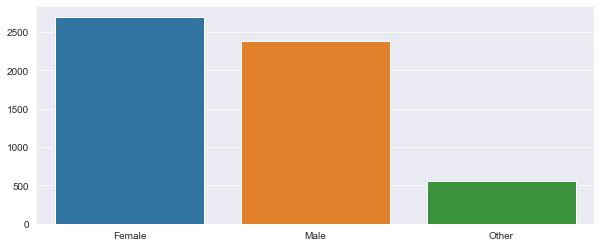

In [27]:
genders = cust_df['gender'].value_counts()
sns.set_style("darkgrid")
plt.figure(figsize=(10,4))
sns.barplot(x=genders.index, y=genders.values)
plt.show()

In [28]:
genders

Female    2701
Male      2383
Other      561
Name: gender, dtype: int64

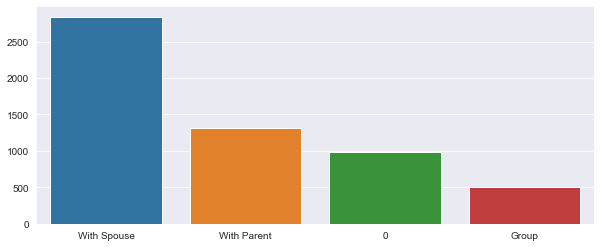

In [29]:
habitation = cust_df.habitationStatus.value_counts()
sns.set_style("darkgrid")
plt.figure(figsize=(10,4))
sns.barplot(x=habitation.index, y=habitation.values)
plt.show()

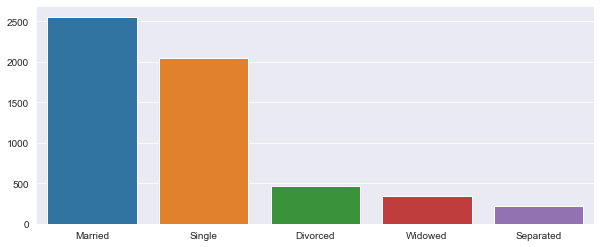

In [30]:
relationship = cust_df.relationshipStatus.value_counts()
sns.set_style("darkgrid")
plt.figure(figsize=(10,4))
sns.barplot(x=relationship.index, y=relationship.values)
plt.show()

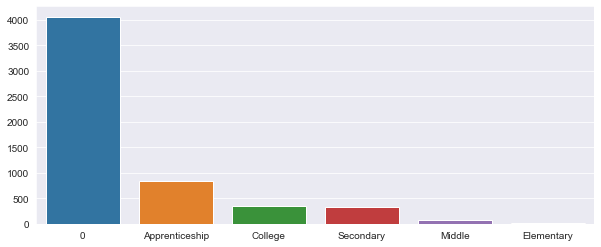

In [31]:
highest_ed = cust_df.schoolAttendance.value_counts()
sns.set_style("darkgrid")
plt.figure(figsize=(10,4))
sns.barplot(x=highest_ed.index, y=highest_ed.values)
plt.show()

In [33]:
worktype_df = pd.DataFrame(data=[worktype.index, worktype.values]).T
worktype_df.columns = ['occupationIndustry','Count']
#before column occupation cleanup
display(worktype_df.shape)
worktype_df['occupationIndustry'] = [str(row)[4:] if str(row)[:4].isdigit() == True else 'N/A' if row==0 else row for row in worktype_df['occupationIndustry']]
#worktype_df['occupationIndustry'] = [str(row) for row in worktype_df['occupationIndustry']]
display(worktype_df.head(20))
display(worktype_df.shape)

(244, 2)

,occupationIndustry,Count
0,,730
1,Retired,715
2,Depository credit intermediation,246
3,Hospitals (6221 to 6223),175
4,Elementary and secondary schools,158
5,"Local, municipal and regional public administ...",105
6,Computer systems design and related services,105
7,Legal services,105
8,Limited-service restaurants,94
9,Universities,91


(244, 2)

In [36]:
#cust_df['totalIncome'].unique()
incomelist=cust_df.totalIncome.value_counts()
#display(incomelist)

income_df = pd.DataFrame(data=[incomelist.index, incomelist.values]).T
income_df.columns = ['income','Count']
income_df = income_df.sort_values(by='Count',ascending=False)
display(income_df.shape)
display(income_df.head(20))

(4900, 2)

,income,Count
0,0.00,712.0
18,85585.50,2.0
20,38895.85,2.0
21,26994.00,2.0
22,27918.55,2.0
23,33849.20,2.0
24,50816.20,2.0
25,21266.95,2.0
27,60084.00,2.0
28,38278.90,2.0


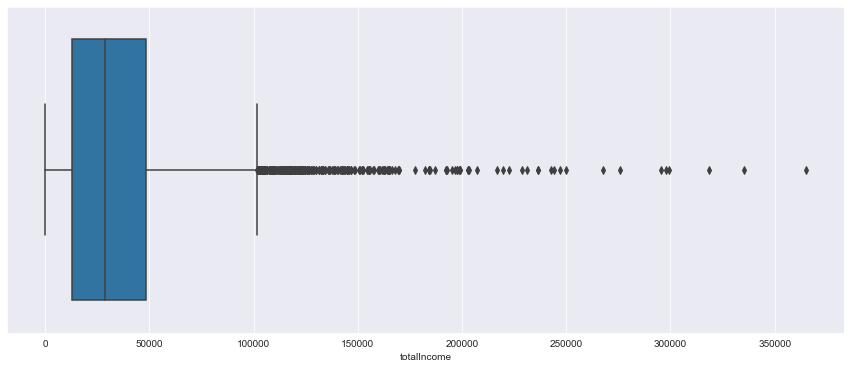

In [37]:
plt.figure(figsize=(15,6))
sns.boxplot(x=cust_df['totalIncome'])

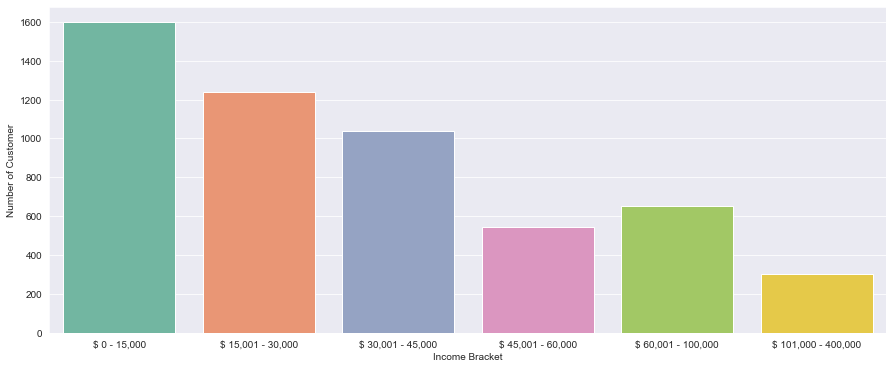

In [38]:
ai0_15 = cust_df["totalIncome"][(cust_df["totalIncome"] >= 0) & (cust_df["totalIncome"] <= 15000)]
ai16_30 = cust_df["totalIncome"][(cust_df["totalIncome"] >= 16000) & (cust_df["totalIncome"] <= 30000)]
ai31_45 = cust_df["totalIncome"][(cust_df["totalIncome"] >= 31000) & (cust_df["totalIncome"] <= 45000)]
ai46_60 = cust_df["totalIncome"][(cust_df["totalIncome"] >= 46000) & (cust_df["totalIncome"] <= 60000)]
ai61_100 = cust_df["totalIncome"][(cust_df["totalIncome"] >= 61000) & (cust_df["totalIncome"] <= 100000)]
ai101_400 = cust_df["totalIncome"][(cust_df["totalIncome"] >= 101000) & (cust_df["totalIncome"] <= 400000)]

aix = ["$ 0 - 15,000", "$ 15,001 - 30,000", "$ 30,001 - 45,000", "$ 45,001 - 60,000", "$ 60,001 - 100,000","$ 101,000 - 400,000"]
aiy = [len(ai0_15.values), len(ai16_30.values), len(ai31_45.values), len(ai46_60.values), len(ai61_100.values),len(ai101_400.values)]

plt.figure(figsize=(15,6))
sns.barplot(x=aix, y=aiy, palette="Set2")
#plt.title("Incomes")
plt.xlabel("Income Bracket")
plt.ylabel("Number of Customer")
plt.show()

In [41]:
cust_df['IncomeBracket']=cust_df['totalIncome'].apply(lambda x: '$ 0 - 15,000' if 0 <= x <= 15000 else '$ 15,001 - 30,000' if 16000 <= x <= 30000 
                                                      else '$ 30,001 - 45,000' if 30000 <= x <= 45000 else '$ 45,001 - 60,000' if 46000 <= x <= 60000
                                                     else '$ 60,001 - 100,000' if 61000 <= x <= 100000 else '$ 100,001 - 400,000')
cust_df.head(5)

,id,type,gender,birthDate,workActivity,occupationIndustry,totalIncome,relationshipStatus,habitationStatus,addresses_principalResidence_province,schoolAttendance,schools,IncomeBracket
0,fe51c153-fbec-4b64-9b00-2530035ef0e1_1bf5af3c-...,Personal,Male,12/26/1985,0,0,0.0,Single,Group,ON,0,0.0,"$ 0 - 15,000"
1,fe51c153-fbec-4b64-9b00-2530035ef0e1_6e740a94-...,Personal,Female,1/30/1977,fulltime,5221 Depository credit intermediation,40009.2,Married,With Spouse,ON,0,0.0,"$ 30,001 - 45,000"
2,fe51c153-fbec-4b64-9b00-2530035ef0e1_3918fdef-...,Personal,Female,11/22/2003,0,0,0.0,Single,With Parent,ON,Secondary,1.0,"$ 0 - 15,000"
3,fe51c153-fbec-4b64-9b00-2530035ef0e1_d81a6d15-...,Personal,Other,5/7/1983,fulltime,"5412 Accounting, tax preparation, bookkeeping ...",44709.0,Married,With Spouse,ON,0,0.0,"$ 30,001 - 45,000"
4,fe51c153-fbec-4b64-9b00-2530035ef0e1_e21dfbc8-...,Personal,Male,1/29/1983,fulltime,4855 Charter bus industry,21496.0,Single,With Parent,ON,0,0.0,"$ 15,001 - 30,000"


In [43]:
cust_df_gb = pd.DataFrame(cust_df.groupby(["relationshipStatus","IncomeBracket"])["IncomeBracket"].count())
#display(cust_df_gb.columns)
cust_df_gb.columns = ['Count']
cust_df_gb.reset_index(inplace=True)
cust_df_gb.columns = ['relationshipStatus','IncomeBracket','Count']
#cust_df_gb['Sort'] = [0 if i =='$ 0 - 15,000' else 1 if i=='$ 15,001 - 30,000' else 2 if i=='$ 30,001 - 45,000' else 3 if i=='$ 45,001 - 60,000' else 4 if i=='$ 60,001 - 100,000' else 5 for i in cust_df_gb['IncomeBracket']]
cust_df_gb['Sort'] = [0 if i =='$ 0 - 15,000' else 1 if i=='$ 15,001 - 30,000' else 2 if i=='$ 30,001 - 45,000' else 3 if i=='$ 45,001 - 60,000' else 4 if i=='$ 60,001 - 100,000' else 5 for i in cust_df_gb['IncomeBracket']]
cust_df_gb.sort_values(['relationshipStatus','Sort'],ascending=True,inplace=True)
cust_df_gb

,relationshipStatus,IncomeBracket,Count,Sort
0,Divorced,"$ 0 - 15,000",42,0
2,Divorced,"$ 15,001 - 30,000",75,1
3,Divorced,"$ 30,001 - 45,000",83,2
4,Divorced,"$ 45,001 - 60,000",63,3
5,Divorced,"$ 60,001 - 100,000",115,4
1,Divorced,"$ 100,001 - 400,000",94,5
6,Married,"$ 0 - 15,000",399,0
8,Married,"$ 15,001 - 30,000",709,1
9,Married,"$ 30,001 - 45,000",742,2
10,Married,"$ 45,001 - 60,000",292,3


In [44]:
fig = px.bar(cust_df_gb, x="relationshipStatus", y="Count", color="IncomeBracket")
fig.show()

In [47]:
cust_df_gb2 = pd.DataFrame(cust_df.groupby(["habitationStatus","IncomeBracket"])["IncomeBracket"].count())
#display(cust_df_gb.columns)
cust_df_gb2.columns = ['Count']
cust_df_gb2.reset_index(inplace=True)
cust_df_gb2.columns = ['habitationStatus','IncomeBracket','Count']
#cust_df_gb2['Sort'] = [0 if i =='$ 0 - 15,000' else 1 if i=='$ 15,001 - 30,000' else 2 if i=='$ 30,001 - 45,000' else 3 if i=='$ 45,001 - 60,000' else 4 if i=='$ 60,001 - 100,000' else 5 for i in cust_df_gb['IncomeBracket']]
cust_df_gb2['Sort'] = [0 if i =='$ 0 - 15,000' else 1 if i=='$ 15,001 - 30,000' else 2 if i=='$ 30,001 - 45,000' else 3 if i=='$ 45,001 - 60,000' else 4 if i=='$ 60,001 - 100,000' else 5 for i in cust_df_gb2['IncomeBracket']]
cust_df_gb2.sort_values(['habitationStatus','Sort'],ascending=True,inplace=True)
cust_df_gb2

,habitationStatus,IncomeBracket,Count,Sort
0,0,"$ 0 - 15,000",84,0
2,0,"$ 15,001 - 30,000",124,1
3,0,"$ 30,001 - 45,000",114,2
4,0,"$ 45,001 - 60,000",153,3
5,0,"$ 60,001 - 100,000",291,4
1,0,"$ 100,001 - 400,000",217,5
6,Group,"$ 0 - 15,000",64,0
8,Group,"$ 15,001 - 30,000",144,1
9,Group,"$ 30,001 - 45,000",129,2
10,Group,"$ 45,001 - 60,000",49,3


In [48]:
fig = px.bar(cust_df_gb2, x="habitationStatus", y="Count", color="IncomeBracket")
fig.show()

In [49]:
cust_df_gb3 = pd.DataFrame(cust_df.groupby(["gender","IncomeBracket"])["IncomeBracket"].count())
#display(cust_df_gb.columns)
cust_df_gb3.columns = ['Count']
cust_df_gb3.reset_index(inplace=True)
cust_df_gb3.columns = ['gender','IncomeBracket','Count']
#cust_df_gb2['Sort'] = [0 if i =='$ 0 - 15,000' else 1 if i=='$ 15,001 - 30,000' else 2 if i=='$ 30,001 - 45,000' else 3 if i=='$ 45,001 - 60,000' else 4 if i=='$ 60,001 - 100,000' else 5 for i in cust_df_gb['IncomeBracket']]
cust_df_gb3['Sort'] = [0 if i =='$ 0 - 15,000' else 1 if i=='$ 15,001 - 30,000' else 2 if i=='$ 30,001 - 45,000' else 3 if i=='$ 45,001 - 60,000' else 4 if i=='$ 60,001 - 100,000' else 5 for i in cust_df_gb3['IncomeBracket']]
cust_df_gb3.sort_values(['gender','Sort'],ascending=True,inplace=True)
cust_df_gb3

,gender,IncomeBracket,Count,Sort
0,Female,"$ 0 - 15,000",752,0
2,Female,"$ 15,001 - 30,000",611,1
3,Female,"$ 30,001 - 45,000",516,2
4,Female,"$ 45,001 - 60,000",251,3
5,Female,"$ 60,001 - 100,000",326,4
1,Female,"$ 100,001 - 400,000",245,5
6,Male,"$ 0 - 15,000",710,0
8,Male,"$ 15,001 - 30,000",495,1
9,Male,"$ 30,001 - 45,000",473,2
10,Male,"$ 45,001 - 60,000",229,3


In [50]:
fig = px.bar(cust_df_gb3, x="gender", y="Count", color="IncomeBracket")
fig.show()

In [51]:
cust_df2 = cust_df.copy()
cust_df2['occupationIndustry'] = [str(row)[4:] if str(row)[:4].isdigit() == True else 'N/A' if row==0 else row for row in cust_df2['occupationIndustry']]
cust_df_gb4 = pd.DataFrame(cust_df2.groupby("occupationIndustry")["IncomeBracket"].count())
#display(cust_df_gb.columns)
cust_df_gb4.columns = ['Count']
cust_df_gb4.reset_index(inplace=True)
cust_df_gb4.columns = ['occupationIndustry','Count']
#cust_df_gb2['Sort'] = [0 if i =='$ 0 - 15,000' else 1 if i=='$ 15,001 - 30,000' else 2 if i=='$ 30,001 - 45,000' else 3 if i=='$ 45,001 - 60,000' else 4 if i=='$ 60,001 - 100,000' else 5 for i in cust_df_gb['IncomeBracket']]
#cust_df_gb4['Sort'] = [0 if i =='$ 0 - 15,000' else 1 if i=='$ 15,001 - 30,000' else 2 if i=='$ 30,001 - 45,000' else 3 if i=='$ 45,001 - 60,000' else 4 if i=='$ 60,001 - 100,000' else 5 for i in cust_df_gb4['occupationIndustry']]
cust_df_gb4.sort_values(['Count'],ascending=False,inplace=True)
cust_df_gb4.head(30)

,occupationIndustry,Count
0,,730
243,Retired,715
55,Depository credit intermediation,246
94,Hospitals (6221 to 6223),175
66,Elementary and secondary schools,158
105,Legal services,105
44,Computer systems design and related services,105
109,"Local, municipal and regional public administ...",105
107,Limited-service restaurants,94
229,Universities,91


In [53]:
df2 = pd.merge(acct_df,cust_df, how='left',left_on=['cust_id'],right_on=['id'])
display(df2.shape)
display(df2.head().iloc[:,0:7])
display(df2.head().iloc[:,7:15])
display(df2.head().iloc[:,15:20])

(11290, 21)

,branchNumber,type_x,openDate,id_x,iban,balance,currency
0,1416,DDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_1894a538-...,0.0,447.56,CAD
1,1416,SDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_e4d4cce1-...,0.0,4592.68,CAD
2,324,DDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_b4c1aad5-...,0.0,4132.75,CAD
3,324,SDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_f71001df-...,0.0,2110.26,CAD
4,1728,DDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_ec10146d-...,0.0,16981.85,CAD


,cust_id,id_y,type_y,gender,birthDate,workActivity,occupationIndustry,totalIncome
0,fe51c153-fbec-4b64-9b00-2530035ef0e1_c418b5e6-...,fe51c153-fbec-4b64-9b00-2530035ef0e1_c418b5e6-...,Personal,Female,1/29/1950,parttime,6111 Elementary and secondary schools,11481.70
1,fe51c153-fbec-4b64-9b00-2530035ef0e1_c418b5e6-...,fe51c153-fbec-4b64-9b00-2530035ef0e1_c418b5e6-...,Personal,Female,1/29/1950,parttime,6111 Elementary and secondary schools,11481.70
2,fe51c153-fbec-4b64-9b00-2530035ef0e1_be23d561-...,fe51c153-fbec-4b64-9b00-2530035ef0e1_be23d561-...,Personal,Male,4/5/1993,parttime,6113 Universities,5150.64
3,fe51c153-fbec-4b64-9b00-2530035ef0e1_be23d561-...,fe51c153-fbec-4b64-9b00-2530035ef0e1_be23d561-...,Personal,Male,4/5/1993,parttime,6113 Universities,5150.64
4,fe51c153-fbec-4b64-9b00-2530035ef0e1_9ed43d58-...,fe51c153-fbec-4b64-9b00-2530035ef0e1_9ed43d58-...,Personal,Male,6/8/1964,fulltime,8121 Personal care services,39075.85


,relationshipStatus,habitationStatus,addresses_principalResidence_province,schoolAttendance,schools
0,Separated,Group,ON,0,0.0
1,Separated,Group,ON,0,0.0
2,Single,With Parent,ON,Apprenticeship,0.0
3,Single,With Parent,ON,Apprenticeship,0.0
4,Married,With Spouse,ON,0,0.0


In [54]:
df3 = pd.merge(tran_df,cust_df, how='left',left_on=['customerId'],right_on=['id'])
display(df3.shape)
display(df3.head().iloc[:,0:7])
display(df3.head().iloc[:,7:15])
display(df3.head().iloc[:,15:20])

(92304, 22)

,description,currencyAmount,locationRegion,locationCity,originationDateTime,customerId,merchantId
0,ADP PMT 59964899,1092.22,0.0,0.0,2018-06-28T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_fa967441-...,0
1,ADP PMT 78870688,701.11,0.0,0.0,2018-06-28T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_ee129e70-...,0
2,ROGERS CABLE E2I6X9,111.98,0.0,0.0,2018-04-30T00:00:00.002Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_ad635ae8-...,3d99af81-c081-4d73-bc44-d3a8e639b22a
3,TIM HORTONS #990 _F,1.16,0.0,0.0,2018-10-09T15:30:00Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_12bd4e47-...,7cc23aa6-0671-4c44-a1b5-b8a98d4bc5d4
4,EMAIL TFR C0***oHp,41.00,0.0,0.0,2018-07-05T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_fb97a9de-...,0


,accountId,categoryTags,id,type,gender,birthDate,workActivity,occupationIndustry
0,fe51c153-fbec-4b64-9b00-2530035ef0e1_5b35142d-...,Income,fe51c153-fbec-4b64-9b00-2530035ef0e1_fa967441-...,Personal,Female,11/21/1969,parttime,6220 Hospitals (6221 to 6223)
1,fe51c153-fbec-4b64-9b00-2530035ef0e1_9172eb97-...,Income,fe51c153-fbec-4b64-9b00-2530035ef0e1_ee129e70-...,Personal,Male,6/10/1995,parttime,"2211 Electric power generation, transmission a..."
2,fe51c153-fbec-4b64-9b00-2530035ef0e1_b527eb36-...,Bills and Utilities,fe51c153-fbec-4b64-9b00-2530035ef0e1_ad635ae8-...,Personal,Female,9/17/1970,fulltime,5221 Depository credit intermediation
3,fe51c153-fbec-4b64-9b00-2530035ef0e1_1185d0e2-...,Food and Dining,fe51c153-fbec-4b64-9b00-2530035ef0e1_12bd4e47-...,Personal,Male,7/13/1999,0,0
4,fe51c153-fbec-4b64-9b00-2530035ef0e1_bf889f32-...,Transfer,fe51c153-fbec-4b64-9b00-2530035ef0e1_fb97a9de-...,Personal,Male,9/16/1982,fulltime,5615 Travel arrangement and reservation services


,totalIncome,relationshipStatus,habitationStatus,addresses_principalResidence_province,schoolAttendance
0,28397.60,Married,With Spouse,ON,0
1,18228.87,Single,With Spouse,ON,College
2,42524.90,Divorced,With Spouse,ON,0
3,0.00,Single,With Parent,ON,Secondary
4,34359.00,Single,With Parent,ON,0


In [55]:
df3['current_date']= pd.to_datetime('2021-07-18')
df3['birthDate']= pd.to_datetime(df3['birthDate'])
#display(df3.head().iloc[:,15:23])
df3['age'] = np.round((df3['current_date'] - df3['birthDate']).dt.days/365,decimals=0)
display(df3.head().iloc[:,:7])
display(df3.head().iloc[:,7:15])
display(df3.head().iloc[:,15:24])
print(df3.columns)

,description,currencyAmount,locationRegion,locationCity,originationDateTime,customerId,merchantId
0,ADP PMT 59964899,1092.22,0.0,0.0,2018-06-28T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_fa967441-...,0
1,ADP PMT 78870688,701.11,0.0,0.0,2018-06-28T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_ee129e70-...,0
2,ROGERS CABLE E2I6X9,111.98,0.0,0.0,2018-04-30T00:00:00.002Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_ad635ae8-...,3d99af81-c081-4d73-bc44-d3a8e639b22a
3,TIM HORTONS #990 _F,1.16,0.0,0.0,2018-10-09T15:30:00Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_12bd4e47-...,7cc23aa6-0671-4c44-a1b5-b8a98d4bc5d4
4,EMAIL TFR C0***oHp,41.00,0.0,0.0,2018-07-05T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_fb97a9de-...,0


,accountId,categoryTags,id,type,gender,birthDate,workActivity,occupationIndustry
0,fe51c153-fbec-4b64-9b00-2530035ef0e1_5b35142d-...,Income,fe51c153-fbec-4b64-9b00-2530035ef0e1_fa967441-...,Personal,Female,1969-11-21,parttime,6220 Hospitals (6221 to 6223)
1,fe51c153-fbec-4b64-9b00-2530035ef0e1_9172eb97-...,Income,fe51c153-fbec-4b64-9b00-2530035ef0e1_ee129e70-...,Personal,Male,1995-06-10,parttime,"2211 Electric power generation, transmission a..."
2,fe51c153-fbec-4b64-9b00-2530035ef0e1_b527eb36-...,Bills and Utilities,fe51c153-fbec-4b64-9b00-2530035ef0e1_ad635ae8-...,Personal,Female,1970-09-17,fulltime,5221 Depository credit intermediation
3,fe51c153-fbec-4b64-9b00-2530035ef0e1_1185d0e2-...,Food and Dining,fe51c153-fbec-4b64-9b00-2530035ef0e1_12bd4e47-...,Personal,Male,1999-07-13,0,0
4,fe51c153-fbec-4b64-9b00-2530035ef0e1_bf889f32-...,Transfer,fe51c153-fbec-4b64-9b00-2530035ef0e1_fb97a9de-...,Personal,Male,1982-09-16,fulltime,5615 Travel arrangement and reservation services


,totalIncome,relationshipStatus,habitationStatus,addresses_principalResidence_province,schoolAttendance,schools,IncomeBracket,current_date,age
0,28397.60,Married,With Spouse,ON,0,0.0,"$ 15,001 - 30,000",2021-07-18,52.0
1,18228.87,Single,With Spouse,ON,College,0.0,"$ 15,001 - 30,000",2021-07-18,26.0
2,42524.90,Divorced,With Spouse,ON,0,0.0,"$ 30,001 - 45,000",2021-07-18,51.0
3,0.00,Single,With Parent,ON,Secondary,1.0,"$ 0 - 15,000",2021-07-18,22.0
4,34359.00,Single,With Parent,ON,0,0.0,"$ 30,001 - 45,000",2021-07-18,39.0


Index(['description', 'currencyAmount', 'locationRegion', 'locationCity',
       'originationDateTime', 'customerId', 'merchantId', 'accountId',
       'categoryTags', 'id', 'type', 'gender', 'birthDate', 'workActivity',
       'occupationIndustry', 'totalIncome', 'relationshipStatus',
       'habitationStatus', 'addresses_principalResidence_province',
       'schoolAttendance', 'schools', 'IncomeBracket', 'current_date', 'age'],
      dtype='object')


In [57]:
agg_df3 = pd.DataFrame(df3.groupby("categoryTags")["currencyAmount"].count())
agg_df3.sort_values("currencyAmount",inplace=True, ascending=False)
agg_df3.reset_index(inplace=True)
agg_df3.columns = ['categoryTags','Number_of_Transactions']
agg_df3

,categoryTags,Number_of_Transactions
0,Transfer,40700
1,Income,17391
2,Bills and Utilities,16118
3,Food and Dining,11346
4,Taxes,2095
5,Mortgage and Rent,1599
6,Shopping,1431
7,Home,599
8,Fees and Charges,503
9,Travel,212


In [58]:
agg2_df3 = pd.DataFrame(df3.groupby("categoryTags")["currencyAmount"].sum())
agg2_df3.sort_values("currencyAmount",inplace=True, ascending=False)
agg2_df3.reset_index(inplace=True)
agg2_df3['currencyAmount'] = np.round(agg2_df3['currencyAmount'])
#display(agg2_df3.columns)
agg2_df3.columns = ['categoryTags','Total_Spending']
agg2_df3

,categoryTags,Total_Spending
0,Income,30379675.0
1,Transfer,29072692.0
2,Taxes,6570457.0
3,Mortgage and Rent,2495702.0
4,Bills and Utilities,1368747.0
5,Travel,135791.0
6,Home,126638.0
7,0,126146.0
8,Shopping,79955.0
9,Food and Dining,62802.0


In [59]:
agg3_df3 = pd.DataFrame(df3.groupby(['description', 'categoryTags'])["currencyAmount"].count())
agg3_df3.sort_values("currencyAmount",inplace=True, ascending=False)
agg3_df3.reset_index(inplace=True)
filter_list = ['Travel', 'Home', 'Shopping','Food and Dining','Entertainment']
#agg3_df3[agg3_df3.categoryTags.isin(filter_list)]
agg4_df3 = agg3_df3[agg3_df3.categoryTags.isin(filter_list)]
#agg3_df3.columns = ['Merchants','Number_of_Transactions']

#agg4_df3['merchant_desc'] = [row.split(' #')[0] if row.split(' #')==' #' else row for row in agg4_df3['description']]
agg4_df3['merchant_desc'] = [row.split(' #')[0] for row in agg4_df3['description']]
agg4_df3['merchant_desc'] = ['AIR CANADA' if 'AIR CANADA' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['AIR TRANSAT' if 'AIR TRANSAT' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['SUNWING' if 'SUNWING' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['SWISS CHALET' if 'SWISS CHALET' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['PORTER AIR' if 'PORTER AIR' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['WESTJET' if 'WESTJET' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['UNITED AIR' if 'UNITED AIR' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['HARVEYS' if 'HARVEYS' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['WINNERS' if 'WINNERS' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['Amazon' if 'Amazo' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['OLD NAVY' if 'OLD NAVY' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['WAL-MART SUPERSTORE' if 'WAL-MART SUPERSTORE' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ["JACK ASTOR'S" if "JACK ASTOR'S" in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['GAP' if 'GAP' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['BANANA REPUBLIC' if 'BANANA REPUBLIC' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['MILESTONES' if 'MILESTONES' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['THE KEG STEAKHOUSE' if 'THE KEG STEAKHOUSE' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['BOSTON PIZZA' if 'BOSTON PIZZA' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['PANERA BREAD' if 'PANERA BREAD' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['IL FORNELLO' if 'IL FORNELLO' in row else row for row in agg4_df3['merchant_desc']]
agg4_df3['merchant_desc'] = ['CINEPLEX' if 'CINEPLEX' in row else row for row in agg4_df3['merchant_desc']]
display(agg4_df3['merchant_desc'].unique())
agg4_df3


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


array(['Amazon', 'TIM HORTONS', 'STARBUCKS', "MCDONALD'S", 'WINNERS',
       'OLD NAVY', "WENDY'S", "HUDSON'S BAY", 'H&M CA', 'GAP', 'SUBWAY',
       "JACK ASTOR'S", 'BANANA REPUBLIC', 'CDN TIRE STORE',
       'SWISS CHALET', 'HARVEYS', 'MILESTONES', 'THE KEG STEAKHOUSE',
       'IL FORNELLO', 'BOSTON PIZZA', 'WAL-MART SUPERSTORE', 'METRO',
       "LONGO'S", 'TORONTO PARKING AUTHORITY', 'AIR CANADA', 'CINEPLEX',
       'UNITED AIR', 'WESTJET', 'PORTER AIR', 'PANERA BREAD', 'LCBO',
       'SUNWING', 'AIR TRANSAT'], dtype=object)

,description,categoryTags,currencyAmount,merchant_desc
7,Amazon *Marketplce CA,Shopping,219,Amazon
8,TIM HORTONS #987 _F,Food and Dining,195,TIM HORTONS
9,TIM HORTONS #899 _F,Food and Dining,173,TIM HORTONS
10,TIM HORTONS #999 _F,Food and Dining,168,TIM HORTONS
12,TIM HORTONS #889 _F,Food and Dining,120,TIM HORTONS
...,...,...,...,...
59496,CDN TIRE STORE #92247,Home,1,CDN TIRE STORE
59497,CDN TIRE STORE #92880,Home,1,CDN TIRE STORE
59498,CDN TIRE STORE #92958,Home,1,CDN TIRE STORE
59499,CDN TIRE STORE #94329,Home,1,CDN TIRE STORE


In [61]:
agg5_df3 = pd.DataFrame(agg4_df3.groupby(['merchant_desc', 'categoryTags'])["currencyAmount"].sum())
agg5_df3.sort_values("currencyAmount",inplace=True, ascending=False)
agg5_df3.reset_index(inplace=True)
agg5_df3.columns = ['merchant_desc','categoryTags','Number_of_Transactions']
agg5_df3

,merchant_desc,categoryTags,Number_of_Transactions
0,TIM HORTONS,Food and Dining,6355
1,STARBUCKS,Food and Dining,2733
2,MCDONALD'S,Food and Dining,1421
3,CDN TIRE STORE,Home,599
4,WINNERS,Shopping,498
5,Amazon,Shopping,452
6,SWISS CHALET,Food and Dining,192
7,SUBWAY,Food and Dining,180
8,WENDY'S,Food and Dining,172
9,OLD NAVY,Shopping,124


In [62]:
agg6_df3 = pd.DataFrame(df3.groupby(['description', 'categoryTags'])["currencyAmount"].sum())
agg6_df3.sort_values("currencyAmount",inplace=True, ascending=False)
agg6_df3.reset_index(inplace=True)
filter_list = ['Travel', 'Home', 'Shopping','Food and Dining','Entertainment']
agg7_df3 = agg6_df3[agg6_df3.categoryTags.isin(filter_list)]

#agg7_df3 = agg6_df3
#agg6_df3.columns = ['Merchants','Number_of_Transactions']

#agg7_df3['merchant_desc'] = [row.split(' #')[0] if row.split(' #')==' #' else row for row in agg7_df3['description']]
agg7_df3['merchant_desc'] = [row.split(' #')[0] for row in agg7_df3['description']]
agg7_df3['merchant_desc'] = ['AIR CANADA' if 'AIR CANADA' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['AIR TRANSAT' if 'AIR TRANSAT' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['SUNWING' if 'SUNWING' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['SWISS CHALET' if 'SWISS CHALET' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['PORTER AIR' if 'PORTER AIR' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['WESTJET' if 'WESTJET' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['UNITED AIR' if 'UNITED AIR' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['HARVEYS' if 'HARVEYS' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['WINNERS' if 'WINNERS' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['Amazon' if 'Amazo' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['OLD NAVY' if 'OLD NAVY' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['WAL-MART SUPERSTORE' if 'WAL-MART SUPERSTORE' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ["JACK ASTOR'S" if "JACK ASTOR'S" in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['GAP' if 'GAP' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['BANANA REPUBLIC' if 'BANANA REPUBLIC' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['MILESTONES' if 'MILESTONES' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['THE KEG STEAKHOUSE' if 'THE KEG STEAKHOUSE' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['BOSTON PIZZA' if 'BOSTON PIZZA' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['PANERA BREAD' if 'PANERA BREAD' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['IL FORNELLO' if 'IL FORNELLO' in row else row for row in agg7_df3['merchant_desc']]
agg7_df3['merchant_desc'] = ['CINEPLEX' if 'CINEPLEX' in row else row for row in agg7_df3['merchant_desc']]
display(agg7_df3['merchant_desc'].unique())
agg7_df3



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


array(['Amazon', 'CDN TIRE STORE', 'WINNERS', 'AIR CANADA', 'OLD NAVY',
       'PORTER AIR', 'WESTJET', 'AIR TRANSAT', 'SUNWING', 'UNITED AIR',
       "HUDSON'S BAY", 'TIM HORTONS', 'H&M CA', 'GAP', "JACK ASTOR'S",
       'BANANA REPUBLIC', 'TORONTO PARKING AUTHORITY', 'SWISS CHALET',
       'HARVEYS', 'STARBUCKS', "MCDONALD'S", 'MILESTONES', 'METRO',
       'THE KEG STEAKHOUSE', "LONGO'S", 'IL FORNELLO',
       'WAL-MART SUPERSTORE', "WENDY'S", 'BOSTON PIZZA', 'CINEPLEX',
       'SUBWAY', 'LCBO', 'PANERA BREAD'], dtype=object)

,description,categoryTags,currencyAmount,merchant_desc
307,Amazon *Marketplce CA,Shopping,24283.00,Amazon
1763,CDN TIRE STORE #89898,Home,4766.66,CDN TIRE STORE
1842,CDN TIRE STORE #03960,Home,4612.13,CDN TIRE STORE
1899,CDN TIRE STORE #97740,Home,4496.02,CDN TIRE STORE
1949,CDN TIRE STORE #23269,Home,4404.50,CDN TIRE STORE
...,...,...,...,...
62595,STARBUCKS #22078,Food and Dining,14.38,STARBUCKS
62596,MCDONALD'S #19072 QPS,Food and Dining,14.34,MCDONALD'S
62599,MCDONALD'S #40352 QPS,Food and Dining,12.47,MCDONALD'S
62601,TIM HORTONS #096 _F,Food and Dining,11.28,TIM HORTONS


In [63]:
agg8_df3 = pd.DataFrame(agg7_df3.groupby(['merchant_desc', 'categoryTags'])["currencyAmount"].sum())
agg8_df3.sort_values("currencyAmount",inplace=True, ascending=False)
agg8_df3.reset_index(inplace=True)
agg8_df3.columns = ['merchant_desc','categoryTags','Sum_of_Spending']
agg8_df3

,merchant_desc,categoryTags,Sum_of_Spending
0,CDN TIRE STORE,Home,126638.47
1,AIR CANADA,Travel,54607.28
2,Amazon,Shopping,50729.32
3,WESTJET,Travel,34245.85
4,TIM HORTONS,Food and Dining,28311.62
5,PORTER AIR,Travel,15898.16
6,SUNWING,Travel,15889.41
7,Amazon,Entertainment,15468.81
8,WINNERS,Shopping,14793.03
9,STARBUCKS,Food and Dining,11964.02


**Unsupervised Learning with Clustering using K Means**

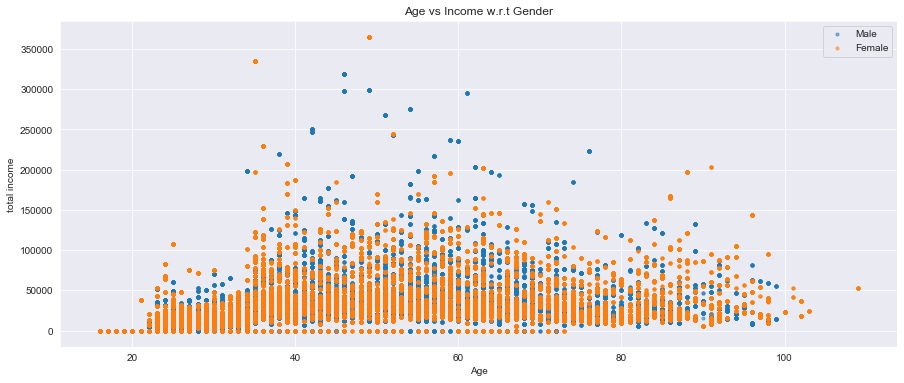

In [64]:
plt.figure(1 , figsize = (15 , 6))
for gender in ['Male' , 'Female']:
    plt.scatter(x = 'age' , y = 'totalIncome' , data = df3[df3['gender'] == gender] ,
                s = 10 , alpha = 0.5 , label = gender)
plt.xlabel('Age'), plt.ylabel('total income') 
plt.title('Age vs Income w.r.t Gender')
plt.legend()
plt.show()

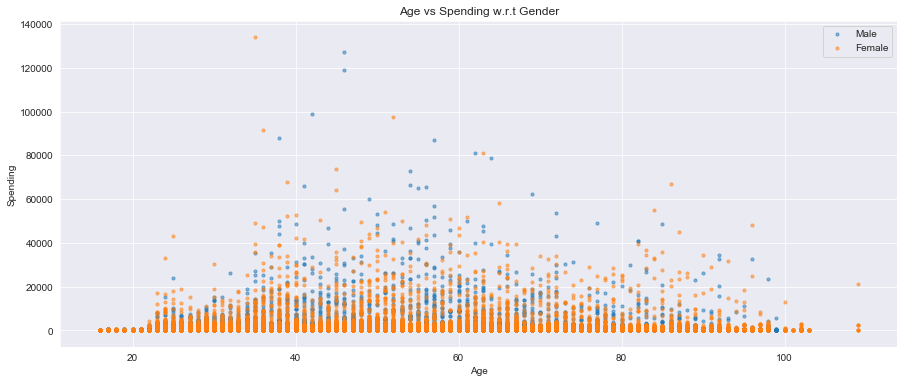

In [65]:
plt.figure(1 , figsize = (15 , 6))
for gender in ['Male' , 'Female']:
    plt.scatter(x = 'age' , y = 'currencyAmount' , data = df3[df3['gender'] == gender] ,
                s = 10 , alpha = 0.5 , label = gender)
plt.xlabel('Age'), plt.ylabel('Spending') 
plt.title('Age vs Spending w.r.t Gender')
plt.legend()
plt.show()

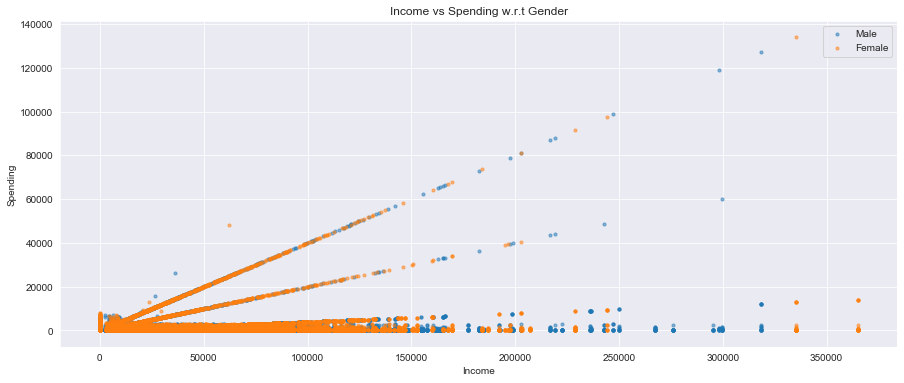

In [66]:
plt.figure(1 , figsize = (15 , 6))
for gender in ['Male' , 'Female']:
    plt.scatter(x = 'totalIncome' , y = 'currencyAmount' , data = df3[df3['gender'] == gender] ,
                s = 10 , alpha = 0.5 , label = gender)
plt.xlabel('Income'), plt.ylabel('Spending') 
plt.title('Income vs Spending w.r.t Gender')
plt.legend()
plt.show()

No handles with labels found to put in legend.


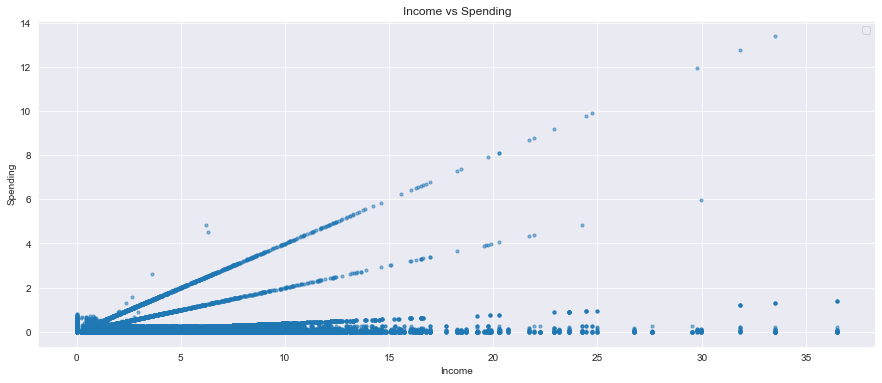

In [67]:
plt.figure(1 , figsize = (15 , 6))

scaled_x = list(df3['totalIncome']/10000)
scaled_y = list(df3['currencyAmount']/10000)

plt.scatter(x = scaled_x , y = scaled_y,
                s = 10 , alpha = 0.5)
plt.xlabel('Income'), plt.ylabel('Spending') 
plt.title('Income vs Spending')
plt.legend()
plt.show();

In [68]:
#Age and income

#X1 = df3[['age','totalIncome']].iloc[: , :].values
X1 = df3[['age','totalIncome']].values

inertia = []

for n in range(1 , 11):

    algorithm = (KMeans(n_clusters = n ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan'))

algorithm.fit(X1)

inertia.append(algorithm.inertia_)

In [70]:
num_clusters = 11
#from sklearn.cluster import KMeans
#km = KMeans(n_clusters=num_clusters, init='random', n_init=1, verbose=1, random_state=3)
#km.fit(vectorized)
X1 = df3[['totalIncome','age']].iloc[: , :].values

distortions = []
for i in range(1, 11):  
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
    km.fit(X1)
    distortions.append(km.inertia_)

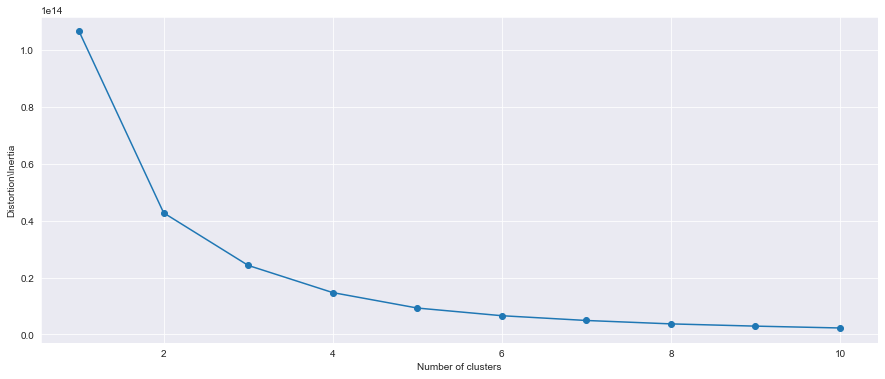

In [71]:
plt.figure(figsize=(15,6))
plt.plot(range(1,11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion\Inertia')
plt.show()

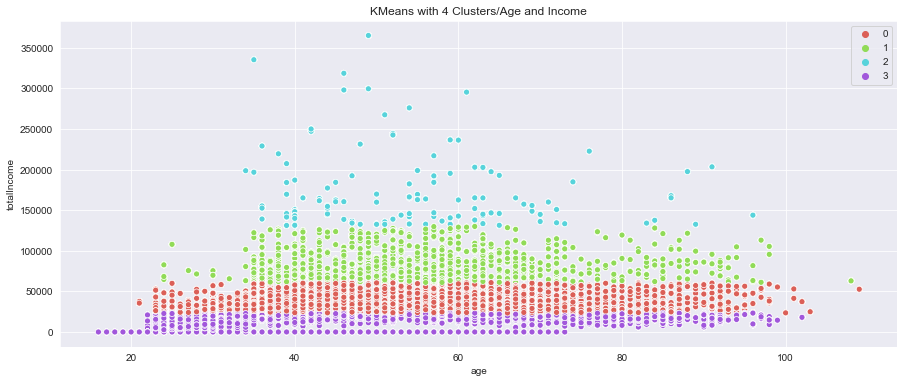

In [72]:
algorithm = KMeans(n_clusters = 4 ,init='k-means++', n_init=10, max_iter=300, random_state=0)
algorithm.fit(X1)

df3['AgeByIncomeLabels'] = algorithm.labels_
plt.figure(figsize=(15, 6))
sns.scatterplot(df3['age'], df3['totalIncome'], hue=algorithm.labels_, 
                palette=sns.color_palette('hls', 4))
plt.title('KMeans with 4 Clusters/Age and Income')
plt.show()

In [73]:
num_clusters = 11
#from sklearn.cluster import KMeans
#km = KMeans(n_clusters=num_clusters, init='random', n_init=1, verbose=1, random_state=3)
X1 = df3[['totalIncome','currencyAmount']].iloc[: , :].values

distortions = []
for i in range(1, 11):  
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
    km.fit(X1)
    distortions.append(km.inertia_)

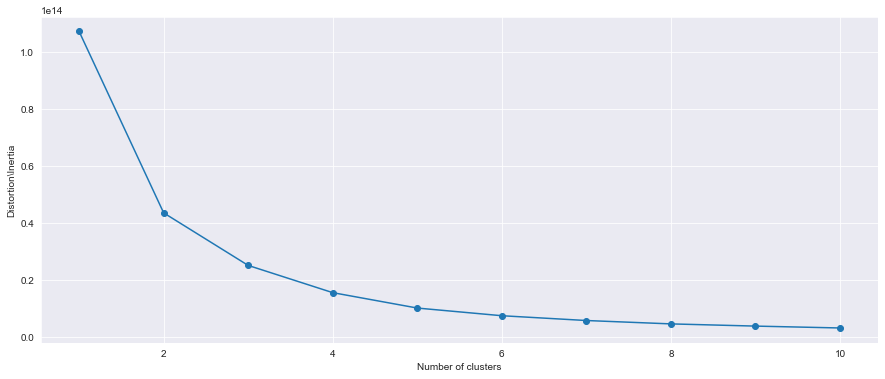

In [74]:
plt.figure(figsize=(15,6))
plt.plot(range(1,11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion\Inertia')
plt.show()

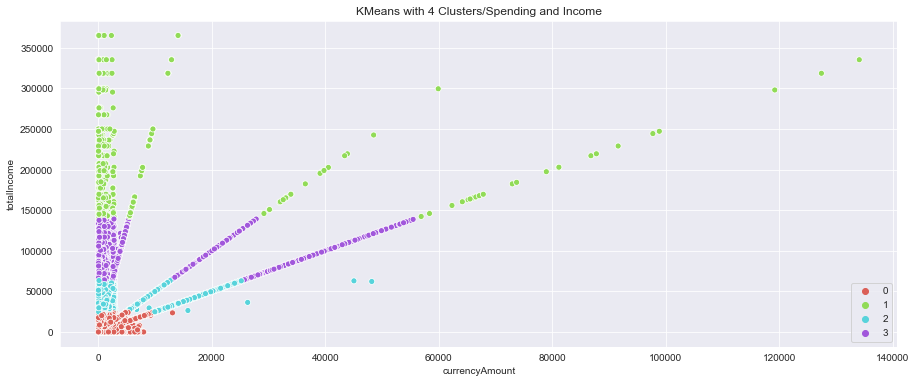

In [75]:
algorithm = KMeans(n_clusters = 4 ,init='k-means++', n_init=10, max_iter=300, random_state=0)
algorithm.fit(X1)

df3['SpendingByIncomeLabels'] = algorithm.labels_
plt.figure(figsize=(15, 6))
sns.scatterplot(df3['currencyAmount'], df3['totalIncome'], hue=algorithm.labels_, 
                palette=sns.color_palette('hls', 4))
plt.title('KMeans with 4 Clusters/Spending and Income')
plt.show()

In [76]:
#Age and spending
X1 = df3[['age' , 'currencyAmount']].iloc[: , :].values
inertia = []
for i in range(1 , 11):
    km2 = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
    km2.fit(X1)
    inertia.append(km2.inertia_)

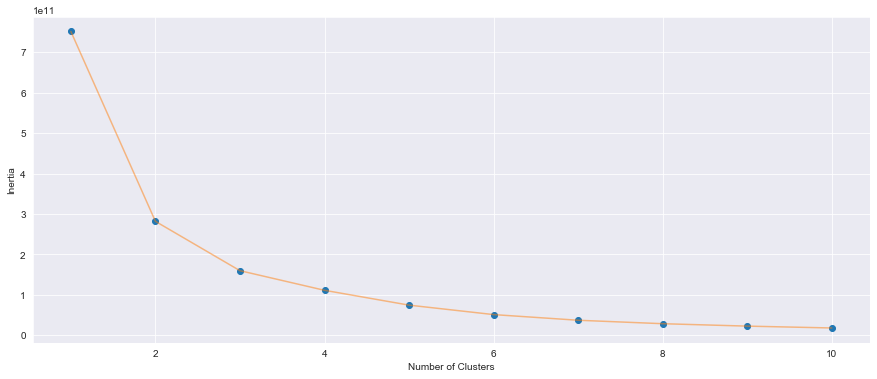

In [77]:
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 11) , inertia , 'o')
plt.plot(np.arange(1 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

In [78]:
X1 = df3[['age','currencyAmount']].iloc[: , :].values

distortions = []
for i in range(1, 11):  
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
    km.fit(X1)
    distortions.append(km.inertia_)

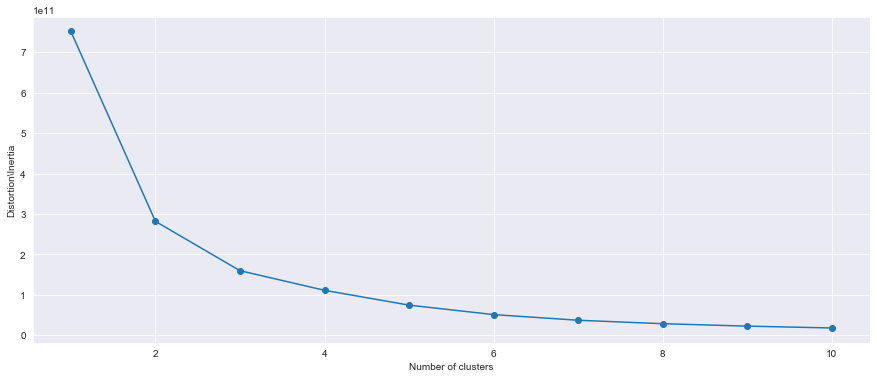

In [79]:
plt.figure(figsize=(15,6))
plt.plot(range(1,11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion\Inertia')
plt.show()

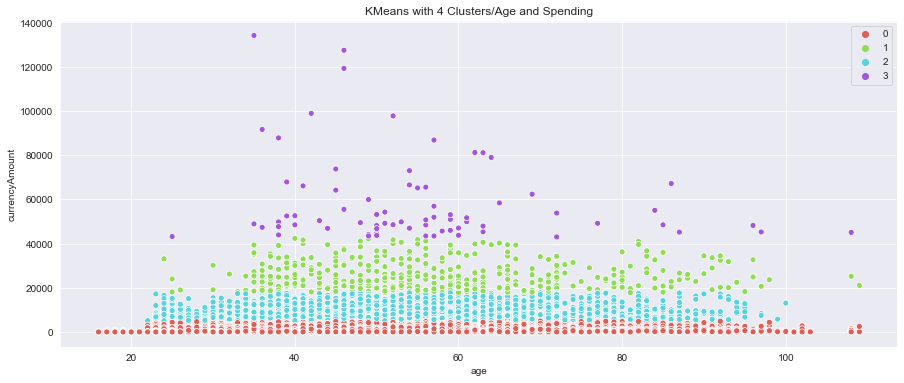

In [80]:
algorithm = KMeans(n_clusters = 4 ,init='k-means++', n_init=10, max_iter=300, random_state=0)
algorithm.fit(X1)

df3['AgeBySpendingLabels'] = algorithm.labels_
plt.figure(figsize=(15, 6))
sns.scatterplot(df3['age'], df3['currencyAmount'], hue=algorithm.labels_, 
                palette=sns.color_palette('hls', 4))
plt.title('KMeans with 4 Clusters/Age and Spending')
plt.show()

In [82]:
num_clusters = 11
#from sklearn.cluster import KMeans
#km = KMeans(n_clusters=num_clusters, init='random', n_init=1, verbose=1, random_state=3)
X1 = df3[['totalIncome','currencyAmount','age']].iloc[: , :].values

distortions = []
for i in range(1, 11):  
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
    km.fit(X1)
    distortions.append(km.inertia_)

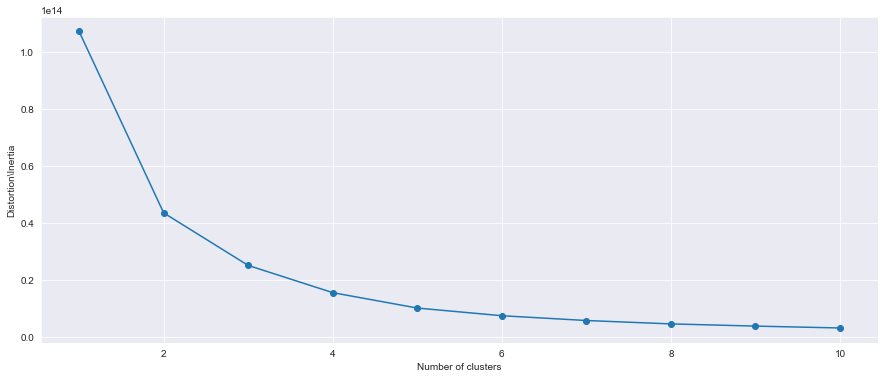

In [83]:
plt.figure(figsize=(15,6))
plt.plot(range(1,11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion\Inertia')
plt.show()

In [84]:
algorithm = KMeans(n_clusters = 4 ,init='k-means++', n_init=10, max_iter=300, random_state=0)
algorithm.fit(X1)
labels3 = algorithm.labels_
centroids3 = algorithm.cluster_centers_

In [85]:
df3['label3'] =  labels3
trace1 = go.Scatter3d(
    x= df3['age'],
    y= df3['currencyAmount'],
    z= df3['totalIncome'],
    mode='markers',
     marker=dict(
        color = df3['label3'], 
        size= 6,
        line=dict(
            color= df3['label3'],
            width= 6
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(  
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Age'),
            yaxis = dict(title  = 'Spending'),
            zaxis = dict(title  = 'Income')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [338]:
df4 = pd.merge(tran_df,cust_df, how='left',left_on=['customerId'],right_on=['id'])
df4['IncomeBracket']=df4['totalIncome'].apply(lambda x: '$ 0 - 15,000' if 0 <= x <= 15000 else '$ 15,001 - 30,000' if 16000 <= x <= 30000 
                                                      else '$ 30,001 - 45,000' if 30000 <= x <= 45000 else '$ 45,001 - 60,000' if 46000 <= x <= 60000
                                                     else '$ 60,001 - 100,000' if 61000 <= x <= 100000 else '$ 100,001 - 400,000')

df4['current_date']= pd.to_datetime('2021-07-18')
df4['birthDate']= pd.to_datetime(df4['birthDate'])
#display(df3.head().iloc[:,15:23])
df4['age'] = np.round((df4['current_date'] - df4['birthDate']).dt.days/365,decimals=0)

#filter in the Categories that are important
filter_list = ['Travel', 'Home', 'Shopping','Food and Dining','Entertainment']
df4 = df4[df4.categoryTags.isin(filter_list)]

#clean up merchant column
#df4['merchant_desc'] = [row.split(' #')[0] if row.split(' #')==' #' else row for row in df4['description']]
df4['merchant_desc'] = [row.split(' #')[0] for row in df4['description']]
df4['merchant_desc'] = ['AIR CANADA' if 'AIR CANADA' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['AIR TRANSAT' if 'AIR TRANSAT' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['SUNWING' if 'SUNWING' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['SWISS CHALET' if 'SWISS CHALET' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['PORTER AIR' if 'PORTER AIR' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['WESTJET' if 'WESTJET' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['UNITED AIR' if 'UNITED AIR' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['HARVEYS' if 'HARVEYS' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['WINNERS' if 'WINNERS' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['Amazon' if 'Amazo' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['OLD NAVY' if 'OLD NAVY' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['WAL-MART SUPERSTORE' if 'WAL-MART SUPERSTORE' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ["JACK ASTOR'S" if "JACK ASTOR'S" in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['GAP' if 'GAP' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['BANANA REPUBLIC' if 'BANANA REPUBLIC' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['MILESTONES' if 'MILESTONES' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['THE KEG STEAKHOUSE' if 'THE KEG STEAKHOUSE' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['BOSTON PIZZA' if 'BOSTON PIZZA' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['PANERA BREAD' if 'PANERA BREAD' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['IL FORNELLO' if 'IL FORNELLO' in row else row for row in df4['merchant_desc']]
df4['merchant_desc'] = ['CINEPLEX' if 'CINEPLEX' in row else row for row in df4['merchant_desc']]

#clean up occupation column
df4['occupationIndustry'] = [str(row)[4:] if str(row)[:4].isdigit() == True else 'N/A' if row==0 else row for row in df4['occupationIndustry']]
df4['occupationIndustry'] = ['N/A' if row == '' else row for row in df4['occupationIndustry']]

#df4['occupationIndustryHL'] = ['N/A' if row == '' else row for row in df4['occupationIndustry']]

#clean up workActivity
#df4['workActivity']= ['N/A' if 0 in row else row for row in df4['workActivity']]
df4['workActivity'] = ['N/A' if row == 0 else row for row in df4['workActivity']]

display(df4.shape)
display(df4.head().iloc[:,0:7])
display(df4.head().iloc[:,7:15])
display(df4.head().iloc[:,15:24])

df5 = df4[['occupationIndustry','workActivity','habitationStatus','categoryTags','merchant_desc','currencyAmount','relationshipStatus','IncomeBracket','age','gender']]
#rename columns
df5.columns = ['occupationIndustry','workActivity','habitationStatus','categoryTags','merchant_desc','spending','relationshipStatus','IncomeBracket','age','gender']
#re order columns
df5 = df5[['occupationIndustry','workActivity','habitationStatus','categoryTags','merchant_desc','gender','relationshipStatus','IncomeBracket','spending','age']]


display(df5.shape)
df5.head(5)

(13714, 25)

,description,currencyAmount,locationRegion,locationCity,originationDateTime,customerId,merchantId
3,TIM HORTONS #990 _F,1.16,0.0,0.0,2018-10-09T15:30:00Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_12bd4e47-...,7cc23aa6-0671-4c44-a1b5-b8a98d4bc5d4
6,TIM HORTONS #969 _F,1.84,0.0,0.0,2018-05-31T12:20:00Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_b69627c2-...,4b8c0e28-ce06-464a-8e00-d80c3ba4a001
15,TIM HORTONS #698 _F,6.36,0.0,0.0,2018-08-23T12:47:00Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_e760b70e-...,19655f4e-e216-4f70-921d-4f2f7d00c52e
22,TIM HORTONS #142 _F,2.87,0.0,0.0,2018-04-12T11:36:00Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_f4cdada2-...,5f49c507-3042-465b-978a-07803433bf19
28,Amazonfca Prime Member,129.99,0.0,0.0,2018-05-14T00:00:00.002Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_543917e3-...,04720403-d023-4585-bd33-c0ef2f994ae8


,accountId,categoryTags,id,type,gender,birthDate,workActivity,occupationIndustry
3,fe51c153-fbec-4b64-9b00-2530035ef0e1_1185d0e2-...,Food and Dining,fe51c153-fbec-4b64-9b00-2530035ef0e1_12bd4e47-...,Personal,Male,1999-07-13,N/A,N/A
6,fe51c153-fbec-4b64-9b00-2530035ef0e1_ce6c6f9b-...,Food and Dining,fe51c153-fbec-4b64-9b00-2530035ef0e1_b69627c2-...,Personal,Female,1998-07-11,fulltime,Full-service restaurants
15,fe51c153-fbec-4b64-9b00-2530035ef0e1_753b7464-...,Food and Dining,fe51c153-fbec-4b64-9b00-2530035ef0e1_e760b70e-...,Personal,Male,2001-11-22,N/A,N/A
22,fe51c153-fbec-4b64-9b00-2530035ef0e1_4e877303-...,Food and Dining,fe51c153-fbec-4b64-9b00-2530035ef0e1_f4cdada2-...,Personal,Male,1999-07-13,N/A,N/A
28,fe51c153-fbec-4b64-9b00-2530035ef0e1_8841ce08-...,Entertainment,fe51c153-fbec-4b64-9b00-2530035ef0e1_543917e3-...,Personal,Male,1955-05-07,fulltime,Radio and television broadcasting


,totalIncome,relationshipStatus,habitationStatus,addresses_principalResidence_province,schoolAttendance,schools,IncomeBracket,current_date,age
3,0.00,Single,With Parent,ON,Secondary,1.0,"$ 0 - 15,000",2021-07-18,22.0
6,21383.01,Single,With Spouse,ON,College,0.0,"$ 15,001 - 30,000",2021-07-18,23.0
15,0.00,Single,With Parent,ON,Secondary,1.0,"$ 0 - 15,000",2021-07-18,20.0
22,0.00,Single,With Parent,ON,Secondary,1.0,"$ 0 - 15,000",2021-07-18,22.0
28,63569.25,Married,With Spouse,ON,0,0.0,"$ 60,001 - 100,000",2021-07-18,66.0


(13714, 10)

,occupationIndustry,workActivity,habitationStatus,categoryTags,merchant_desc,gender,relationshipStatus,IncomeBracket,spending,age
3,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",1.16,22.0
6,Full-service restaurants,fulltime,With Spouse,Food and Dining,TIM HORTONS,Female,Single,"$ 15,001 - 30,000",1.84,23.0
15,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",6.36,20.0
22,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",2.87,22.0
28,Radio and television broadcasting,fulltime,With Spouse,Entertainment,Amazon,Male,Married,"$ 60,001 - 100,000",129.99,66.0


In [339]:
df5.info()
display(df5.shape)
df5 = df5.loc[df5['workActivity']!=0]
df5 = df5.loc[df5['habitationStatus']!=0]
display(df5.shape)
lgbm_data = df5.copy()
dbscan_data = df5.copy()
kprot_data = df5.copy()

#seriesObj = df5.apply(lambda x: True if 0 in list(x) else False, axis=0)
#seriesObj

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13714 entries, 3 to 92302
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   occupationIndustry  13714 non-null  object 
 1   workActivity        13714 non-null  object 
 2   habitationStatus    13714 non-null  object 
 3   categoryTags        13714 non-null  object 
 4   merchant_desc       13714 non-null  object 
 5   gender              13714 non-null  object 
 6   relationshipStatus  13714 non-null  object 
 7   IncomeBracket       13714 non-null  object 
 8   spending            13714 non-null  float64
 9   age                 13714 non-null  float64
dtypes: float64(2), object(8)
memory usage: 1.2+ MB


(13714, 10)

(12899, 10)

In [340]:
display(df5.shape)
display(df5.head())
seriesObj = df5.apply(lambda x: True if 0 in list(x) else False, axis=0)
seriesObj

(12899, 10)

,occupationIndustry,workActivity,habitationStatus,categoryTags,merchant_desc,gender,relationshipStatus,IncomeBracket,spending,age
3,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",1.16,22.0
6,Full-service restaurants,fulltime,With Spouse,Food and Dining,TIM HORTONS,Female,Single,"$ 15,001 - 30,000",1.84,23.0
15,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",6.36,20.0
22,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",2.87,22.0
28,Radio and television broadcasting,fulltime,With Spouse,Entertainment,Amazon,Male,Married,"$ 60,001 - 100,000",129.99,66.0


occupationIndustry    False
workActivity          False
habitationStatus      False
categoryTags          False
merchant_desc         False
gender                False
relationshipStatus    False
IncomeBracket         False
spending              False
age                   False
dtype: bool

In [344]:
kprot_output = kprot_data.copy()
kprot_data.head(5)

,occupationIndustry,workActivity,habitationStatus,categoryTags,merchant_desc,gender,relationshipStatus,IncomeBracket,spending,age
3,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",1.16,22.0
6,Full-service restaurants,fulltime,With Spouse,Food and Dining,TIM HORTONS,Female,Single,"$ 15,001 - 30,000",1.84,23.0
15,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",6.36,20.0
22,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",2.87,22.0
28,Radio and television broadcasting,fulltime,With Spouse,Entertainment,Amazon,Male,Married,"$ 60,001 - 100,000",129.99,66.0


In [345]:
#kprot_data = df5.copy()
for c in kprot_data.select_dtypes(exclude='object').columns:
    pt = PowerTransformer()
    kprot_data[c] =  pt.fit_transform(np.array(kprot_data[c]).reshape(-1, 1))

In [346]:
categorical_columns = [0, 1, 2, 3, 4, 5, 6, 7] #make sure to specify correct indices

In [348]:
kproto = KPrototypes(n_clusters= 10, init='Cao', n_jobs = 4)
clusters = kproto.fit_predict(kprot_data, categorical=categorical_columns)

In [349]:
pd.Series(clusters).value_counts()

2    2089
8    1833
7    1618
4    1556
6    1349
5    1176
0     955
3     952
1     920
9     451
dtype: int64

In [350]:
kprot_output.head(5)


,occupationIndustry,workActivity,habitationStatus,categoryTags,merchant_desc,gender,relationshipStatus,IncomeBracket,spending,age,kprotocluster
3,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",1.16,22.0,6
6,Full-service restaurants,fulltime,With Spouse,Food and Dining,TIM HORTONS,Female,Single,"$ 15,001 - 30,000",1.84,23.0,6
15,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",6.36,20.0,2
22,N/A,N/A,With Parent,Food and Dining,TIM HORTONS,Male,Single,"$ 0 - 15,000",2.87,22.0,1
28,Radio and television broadcasting,fulltime,With Spouse,Entertainment,Amazon,Male,Married,"$ 60,001 - 100,000",129.99,66.0,0


In [352]:
#Setting the objects to category 
#lgbm_data = df5.copy()
for c in lgbm_data.select_dtypes(include='object'):
    lgbm_data[c] = lgbm_data[c].astype('category')

clf_kp = LGBMClassifier()
cv_scores_kp = cross_val_score(clf_kp, lgbm_data, kproto.labels_, scoring='f1_weighted')
print(f'CV F1 score for K-Prototypes clusters is {np.mean(cv_scores_kp)}')


CV F1 score for K-Prototypes clusters is 0.9959686625768687


In [353]:
clf_kp.fit(lgbm_data, kproto.labels_)

LGBMClassifier()

In [354]:
explainer_kp = shap.TreeExplainer(clf_kp)
shap_values_kp = explainer_kp.shap_values(lgbm_data)

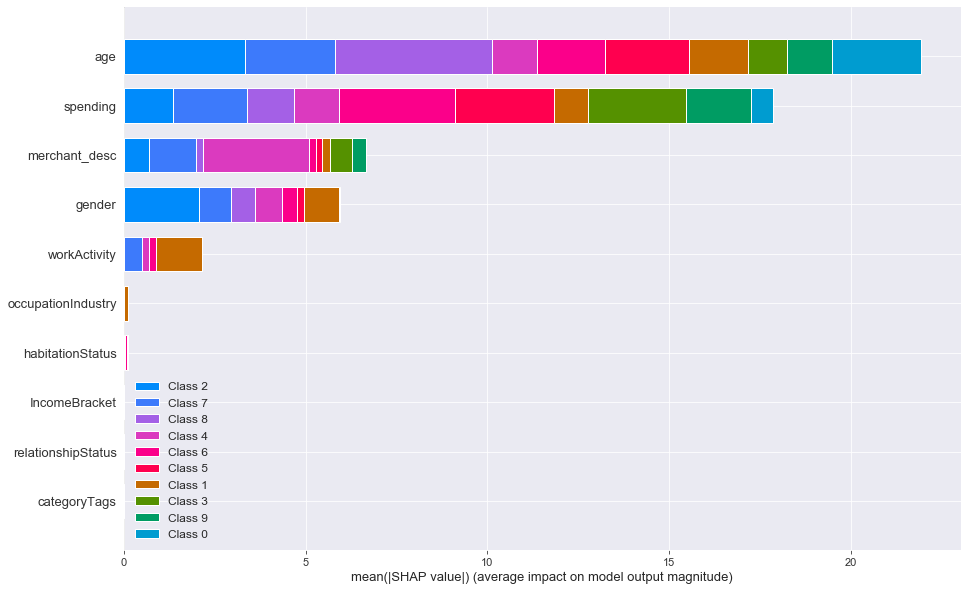

In [355]:
shap.summary_plot(shap_values_kp, lgbm_data, plot_type="bar", plot_size=(15, 10))

In [363]:
#Preprocessing numerical
numerical = df5.select_dtypes(exclude='object')

for c in numerical.columns:
    pt = PowerTransformer()
    numerical.loc[:, c] = pt.fit_transform(np.array(numerical[c]).reshape(-1, 1))
    
#preprocessing categorical
categorical = df5.select_dtypes(include='object')
categorical = pd.get_dummies(categorical)

#Percentage of columns which are categorical is used as weight parameter in embeddings later
categorical_weight = len(df5.select_dtypes(include='object').columns) / df5.shape[1]

#Embedding numerical & categorical
fit1 = umap.UMAP(metric='l2').fit(numerical)
fit2 = umap.UMAP(metric='dice').fit(categorical)
#fit1 = umap.UMAP.fit(numerical)
#fit2 = umap.UMAP.fit(categorical)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
gradient function is not yet implemented for dice distance metric; inverse_transform will be unavailable


In [364]:
#Augmenting the numerical embedding with categorical
intersection = umap.general_simplicial_set_intersection(fit1.graph_, fit2.graph_, weight=categorical_weight)
intersection = umap.reset_local_connectivity(intersection)
embedding = umap.simplicial_set_embedding(fit1._raw_data, intersection, fit1.n_components, 
                                                fit1._initial_alpha, fit1._a, fit1._b, 
                                                fit1.repulsion_strength, fit1.negative_sample_rate, 
                                                200, 'random', np.random, fit1.metric, fit1._metric_kwds, None, False, False, False)



In [365]:
new_embedding = np.array(embedding).T
display(new_embedding[0][:,0])
display(new_embedding[0][:,1])
#new_embedding[:,0]

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


array([ 14.451767 ,  12.775094 ,  15.834651 , ..., -10.763433 ,
        15.699861 ,  -6.8865175], dtype=float32)

array([  5.349049 , -10.738068 ,   5.020817 , ...,   2.7987807,
         4.432799 ,   5.7458873], dtype=float32)

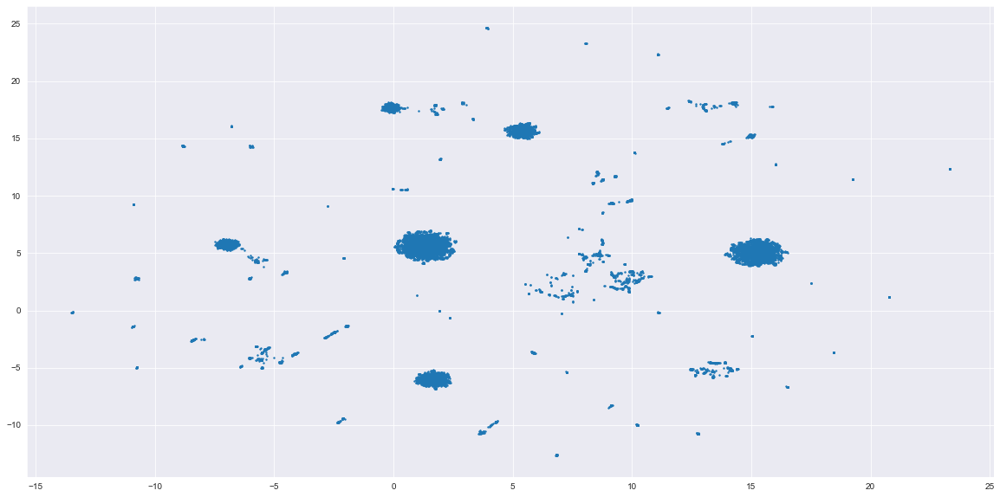

In [366]:

#fit1?
#umap?
#embedding

plt.figure(figsize=(20, 10))

plt.scatter(new_embedding[0][:, 0], new_embedding[0][:, 1], s=2, cmap='Spectral', alpha=1.0)
#plt.scatter(np.array(embedding).T, s=2, cmap='Spectral', alpha=1.0)
#plt.scatter(*embedding.T, s=2, cmap='Spectral', alpha=1.0)
plt.show()

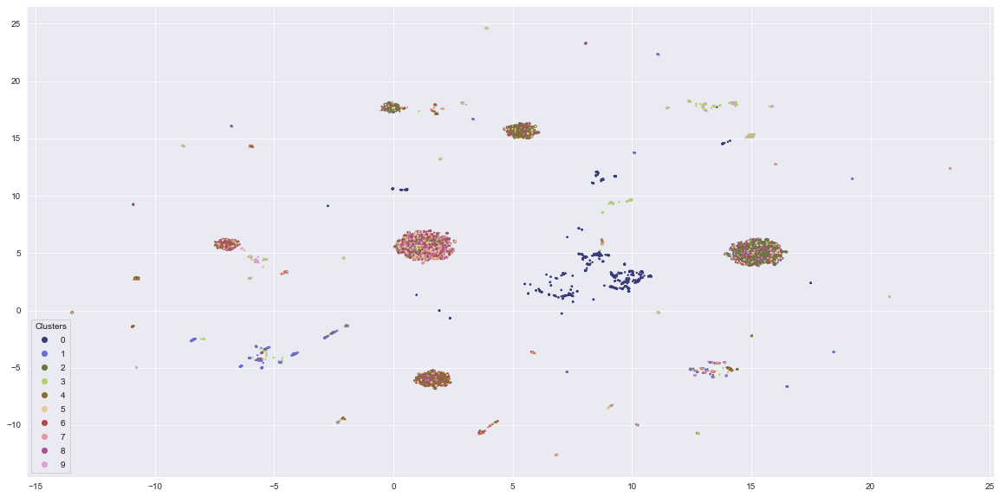

In [367]:
fig, ax = plt.subplots()
fig.set_size_inches((20, 10))
scatter = ax.scatter(new_embedding[0][:, 0], new_embedding[0][:, 1], s=2, c=clusters, cmap='tab20b', alpha=1.0)

# produce a legend with the unique colors from the scatter
legend1 = ax.legend(*scatter.legend_elements(num=10),
                    loc="lower left", title="Clusters")
ax.add_artist(legend1)

In [127]:
#This takes A LONG time to graph

#costs = []
#n_clusters = []
##clusters_assigned = []

#for i in tqdm(range(2, 30)):
#    try:
#        kproto = KPrototypes(n_clusters= i, init='Cao', verbose=2)
#        clusters = kproto.fit_predict(kprot_data, categorical=[0, 1, 2, 3, 4, 5, 6])
#        costs.append(kproto.cost_)
#        n_clusters.append(i)
#        clusters_assigned.append(clusters)
#    except:
#        print(f"Can't cluster with {i} clusters")
        
#fig = go.Figure(data=go.Scatter(x=n_clusters, y=costs ))
#fig.show()

  0%|                                                                                           | 0/28 [00:00<?, ?it/s]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 3405, ncost: 28314.410676664487
Run: 1, iteration: 2/100, moves: 1634, ncost: 27454.10933443787
Run: 1, iteration: 3/100, moves: 1133, ncost: 26917.084825558293
Run: 1, iteration: 4/100, moves: 791, ncost: 26709.239036221243
Run: 1, iteration: 5/100, moves: 491, ncost: 26642.1098514187
Run: 1, iteration: 6/100, moves: 322, ncost: 26614.6994301109
Run: 1, iteration: 7/100, moves: 150, ncost: 26607.783804298517
Run: 1, iteration: 8/100, moves: 68, ncost: 26606.250923915268
Run: 1, iteration: 9/100, moves: 39, ncost: 26605.733010948552
Run: 1, iteration: 10/100, moves: 21, ncost: 26605.624479131144
Run: 1, iteration: 11/100, moves: 2, ncost: 26605.622165718007
Run: 1, iteration: 12/100, moves: 3, ncost: 26605.618538639977
Run: 1, iteration: 13/100, moves: 0, ncost: 26605.618538639977
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iterati

  4%|██▊                                                                             | 1/28 [02:53<1:18:06, 173.56s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 1188, ncost: 20587.669853046016
Run: 1, iteration: 2/100, moves: 200, ncost: 20539.985785474608
Run: 1, iteration: 3/100, moves: 357, ncost: 20487.403292064824
Run: 1, iteration: 4/100, moves: 170, ncost: 20480.54581883241
Run: 1, iteration: 5/100, moves: 33, ncost: 20480.321629637096
Run: 1, iteration: 6/100, moves: 5, ncost: 20480.312348671225
Run: 1, iteration: 7/100, moves: 5, ncost: 20480.30930375481
Run: 1, iteration: 8/100, moves: 0, ncost: 20480.30930375481
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 3127, ncost: 21434.71179850918
Run: 2, iteration: 2/100, moves: 1451, ncost: 20482.608030213352
Run: 2, iteration: 3/100, moves: 530, ncost: 20404.17850250625
Run: 2, iteration: 4/100, moves: 181, ncost: 20397.318239614528
Run: 2, iteration: 5/100, moves: 11, ncost: 20397.160278908672
Run: 2, iteration:

  7%|█████▋                                                                          | 2/28 [05:24<1:12:19, 166.90s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 2009, ncost: 17871.076491291555
Run: 1, iteration: 2/100, moves: 1576, ncost: 17315.39179617718
Run: 1, iteration: 3/100, moves: 1104, ncost: 16816.2405052126
Run: 1, iteration: 4/100, moves: 708, ncost: 16518.08404106067
Run: 1, iteration: 5/100, moves: 453, ncost: 16443.70845346854
Run: 1, iteration: 6/100, moves: 182, ncost: 16433.08932193907
Run: 1, iteration: 7/100, moves: 69, ncost: 16431.72969251804
Run: 1, iteration: 8/100, moves: 26, ncost: 16431.444882234548
Run: 1, iteration: 9/100, moves: 20, ncost: 16431.305379821573
Run: 1, iteration: 10/100, moves: 12, ncost: 16431.264514713115
Run: 1, iteration: 11/100, moves: 6, ncost: 16431.24548309114
Run: 1, iteration: 12/100, moves: 7, ncost: 16431.23261433659
Run: 1, iteration: 13/100, moves: 1, ncost: 16431.23146812917
Run: 1, iteration: 14/100, moves: 0, ncost: 16431.23146812917
Init: initializing centroids
Init: init

 11%|████████▌                                                                       | 3/28 [07:42<1:05:50, 158.00s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 2944, ncost: 18161.53439360179
Run: 1, iteration: 2/100, moves: 2012, ncost: 16339.28498081495
Run: 1, iteration: 3/100, moves: 473, ncost: 16291.737211186235
Run: 1, iteration: 4/100, moves: 30, ncost: 16290.287887399967
Run: 1, iteration: 5/100, moves: 7, ncost: 16290.119636334728
Run: 1, iteration: 6/100, moves: 7, ncost: 16290.030542035714
Run: 1, iteration: 7/100, moves: 2, ncost: 16290.02127284808
Run: 1, iteration: 8/100, moves: 0, ncost: 16290.02127284808
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 3912, ncost: 16345.70159380167
Run: 2, iteration: 2/100, moves: 1803, ncost: 15266.387423806396
Run: 2, iteration: 3/100, moves: 811, ncost: 15145.547224064063
Run: 2, iteration: 4/100, moves: 464, ncost: 15115.48766598509
Run: 2, iteration: 5/100, moves: 554, ncost: 15067.683388231699
Run: 2, iteration: 

 14%|███████████▋                                                                      | 4/28 [09:41<58:32, 146.34s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 2884, ncost: 15180.048578672733
Run: 1, iteration: 2/100, moves: 1855, ncost: 14332.533961442523
Run: 1, iteration: 3/100, moves: 1438, ncost: 13705.920468846238
Run: 1, iteration: 4/100, moves: 915, ncost: 13398.415452092348
Run: 1, iteration: 5/100, moves: 721, ncost: 12971.722434307678
Run: 1, iteration: 6/100, moves: 160, ncost: 12966.854917191313
Run: 1, iteration: 7/100, moves: 38, ncost: 12966.601055819523
Run: 1, iteration: 8/100, moves: 2, ncost: 12966.597322751677
Run: 1, iteration: 9/100, moves: 0, ncost: 12966.597322751677
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 3615, ncost: 14860.500643099509
Run: 2, iteration: 2/100, moves: 2661, ncost: 14255.262450746237
Run: 2, iteration: 3/100, moves: 1053, ncost: 14154.454410108947
Run: 2, iteration: 4/100, moves: 807, ncost: 14071.770773222534
Run: 2,

 18%|██████████████▋                                                                   | 5/28 [11:50<54:10, 141.34s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 4987, ncost: 13540.877262847242
Run: 1, iteration: 2/100, moves: 1345, ncost: 12818.635978316557
Run: 1, iteration: 3/100, moves: 509, ncost: 12785.919961324882
Run: 1, iteration: 4/100, moves: 193, ncost: 12781.997094863964
Run: 1, iteration: 5/100, moves: 67, ncost: 12781.14792496485
Run: 1, iteration: 6/100, moves: 75, ncost: 12779.573070142096
Run: 1, iteration: 7/100, moves: 58, ncost: 12778.911019569698
Run: 1, iteration: 8/100, moves: 14, ncost: 12778.851119846515
Run: 1, iteration: 9/100, moves: 6, ncost: 12778.838863065745
Run: 1, iteration: 10/100, moves: 3, ncost: 12778.835696788276
Run: 1, iteration: 11/100, moves: 0, ncost: 12778.835696788276
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 4288, ncost: 14545.018999376569
Run: 2, iteration: 2/100, moves: 2680, ncost: 13585.866399601211
Run: 2, itera

 21%|█████████████████▌                                                                | 6/28 [14:23<53:03, 144.72s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 5098, ncost: 11727.884909377666
Run: 1, iteration: 2/100, moves: 868, ncost: 11665.90725380545
Run: 1, iteration: 3/100, moves: 439, ncost: 11512.569039894055
Run: 1, iteration: 4/100, moves: 394, ncost: 11460.246125705067
Run: 1, iteration: 5/100, moves: 59, ncost: 11459.870763187304
Run: 1, iteration: 6/100, moves: 38, ncost: 11459.683101817625
Run: 1, iteration: 7/100, moves: 34, ncost: 11459.515980100437
Run: 1, iteration: 8/100, moves: 58, ncost: 11458.845137438946
Run: 1, iteration: 9/100, moves: 156, ncost: 11453.598477959324
Run: 1, iteration: 10/100, moves: 58, ncost: 11453.065032102213
Run: 1, iteration: 11/100, moves: 14, ncost: 11453.028110432233
Run: 1, iteration: 12/100, moves: 3, ncost: 11453.024452137828
Run: 1, iteration: 13/100, moves: 0, ncost: 11453.024452137828
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iterat

 25%|████████████████████▌                                                             | 7/28 [16:56<51:32, 147.25s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 4745, ncost: 11157.690418532296
Run: 1, iteration: 2/100, moves: 1179, ncost: 11004.289406868716
Run: 1, iteration: 3/100, moves: 307, ncost: 10992.723225317914
Run: 1, iteration: 4/100, moves: 107, ncost: 10990.272906467466
Run: 1, iteration: 5/100, moves: 53, ncost: 10989.067764074032
Run: 1, iteration: 6/100, moves: 52, ncost: 10987.425105047647
Run: 1, iteration: 7/100, moves: 42, ncost: 10986.035073161003
Run: 1, iteration: 8/100, moves: 68, ncost: 10982.783111206001
Run: 1, iteration: 9/100, moves: 95, ncost: 10975.643300437008
Run: 1, iteration: 10/100, moves: 127, ncost: 10948.51476462678
Run: 1, iteration: 11/100, moves: 71, ncost: 10945.295391568208
Run: 1, iteration: 12/100, moves: 15, ncost: 10945.160483358079
Run: 1, iteration: 13/100, moves: 4, ncost: 10945.144232433246
Run: 1, iteration: 14/100, moves: 0, ncost: 10945.144232433246
Init: initializing centroids


 29%|███████████████████████▍                                                          | 8/28 [19:23<48:59, 146.98s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 4349, ncost: 10853.656511362995
Run: 1, iteration: 2/100, moves: 1357, ncost: 10699.96725314962
Run: 1, iteration: 3/100, moves: 645, ncost: 10635.47502802853
Run: 1, iteration: 4/100, moves: 369, ncost: 10623.102156804693
Run: 1, iteration: 5/100, moves: 253, ncost: 10612.614572429018
Run: 1, iteration: 6/100, moves: 628, ncost: 10567.955608090977
Run: 1, iteration: 7/100, moves: 251, ncost: 10563.743648910964
Run: 1, iteration: 8/100, moves: 68, ncost: 10563.0475006911
Run: 1, iteration: 9/100, moves: 60, ncost: 10562.397052779252
Run: 1, iteration: 10/100, moves: 52, ncost: 10561.530964806843
Run: 1, iteration: 11/100, moves: 36, ncost: 10561.132027485199
Run: 1, iteration: 12/100, moves: 20, ncost: 10561.071203038326
Run: 1, iteration: 13/100, moves: 9, ncost: 10561.035461162523
Run: 1, iteration: 14/100, moves: 11, ncost: 10560.991935562342
Run: 1, iteration: 15/100, mo

 32%|██████████████████████████▎                                                       | 9/28 [22:21<49:33, 156.48s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 4564, ncost: 11329.673999679188
Run: 1, iteration: 2/100, moves: 1550, ncost: 11025.956166502348
Run: 1, iteration: 3/100, moves: 794, ncost: 10957.636178442479
Run: 1, iteration: 4/100, moves: 543, ncost: 10912.809175507558
Run: 1, iteration: 5/100, moves: 411, ncost: 10881.647116057338
Run: 1, iteration: 6/100, moves: 232, ncost: 10872.803019671663
Run: 1, iteration: 7/100, moves: 155, ncost: 10859.590660907324
Run: 1, iteration: 8/100, moves: 106, ncost: 10853.970426859209
Run: 1, iteration: 9/100, moves: 112, ncost: 10847.998704689227
Run: 1, iteration: 10/100, moves: 55, ncost: 10847.301675809758
Run: 1, iteration: 11/100, moves: 30, ncost: 10847.137916317695
Run: 1, iteration: 12/100, moves: 20, ncost: 10847.081182572676
Run: 1, iteration: 13/100, moves: 10, ncost: 10846.586624631112
Run: 1, iteration: 14/100, moves: 105, ncost: 10838.399692833564
Run: 1, iteration: 15

 36%|████████████████████████████▉                                                    | 10/28 [25:44<51:06, 170.37s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 3751, ncost: 10614.782026984218
Run: 1, iteration: 2/100, moves: 1241, ncost: 10413.80261026167
Run: 1, iteration: 3/100, moves: 795, ncost: 10309.180909079714
Run: 1, iteration: 4/100, moves: 708, ncost: 10218.960269409838
Run: 1, iteration: 5/100, moves: 417, ncost: 10186.98752332387
Run: 1, iteration: 6/100, moves: 230, ncost: 10179.474516838083
Run: 1, iteration: 7/100, moves: 58, ncost: 10179.069726874126
Run: 1, iteration: 8/100, moves: 16, ncost: 10179.000583160232
Run: 1, iteration: 9/100, moves: 19, ncost: 10178.920649158043
Run: 1, iteration: 10/100, moves: 7, ncost: 10178.899454806744
Run: 1, iteration: 11/100, moves: 3, ncost: 10178.895897918646
Run: 1, iteration: 12/100, moves: 0, ncost: 10178.895897918646
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 5851, ncost: 10346.849723443038
Run: 2, itera

 39%|███████████████████████████████▊                                                 | 11/28 [29:14<51:36, 182.12s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 5694, ncost: 11320.988210808686
Run: 1, iteration: 2/100, moves: 2427, ncost: 9865.276662527562
Run: 1, iteration: 3/100, moves: 1245, ncost: 9641.596484755504
Run: 1, iteration: 4/100, moves: 509, ncost: 9619.99317386811
Run: 1, iteration: 5/100, moves: 196, ncost: 9614.102270046498
Run: 1, iteration: 6/100, moves: 123, ncost: 9611.990009953759
Run: 1, iteration: 7/100, moves: 53, ncost: 9611.270337050024
Run: 1, iteration: 8/100, moves: 53, ncost: 9610.61760405734
Run: 1, iteration: 9/100, moves: 64, ncost: 9609.419513077031
Run: 1, iteration: 10/100, moves: 106, ncost: 9606.54362314385
Run: 1, iteration: 11/100, moves: 137, ncost: 9600.804578268264
Run: 1, iteration: 12/100, moves: 109, ncost: 9598.797565608284
Run: 1, iteration: 13/100, moves: 84, ncost: 9597.683090729886
Run: 1, iteration: 14/100, moves: 73, ncost

 43%|██████████████████████████████████▋                                              | 12/28 [32:45<50:53, 190.83s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 4346, ncost: 10502.907739448738
Run: 1, iteration: 2/100, moves: 1107, ncost: 10337.740511908862
Run: 1, iteration: 3/100, moves: 856, ncost: 10218.007180672717
Run: 1, iteration: 4/100, moves: 406, ncost: 10184.191261481345
Run: 1, iteration: 5/100, moves: 228, ncost: 10161.440197276746
Run: 1, iteration: 6/100, moves: 232, ncost: 10132.289067172132
Run: 1, iteration: 7/100, moves: 155, ncost: 10122.318912042094
Run: 1, iteration: 8/100, moves: 76, ncost: 10118.121114628646
Run: 1, iteration: 9/100, moves: 19, ncost: 10118.001506171266
Run: 1, iteration: 10/100, moves: 12, ncost: 10117.973298506577
Run: 1, iteration: 11/100, moves: 2, ncost: 10117.970288905923
Run: 1, iteration: 12/100, moves: 2, ncost: 10117.96674270215
Run: 1, iteration: 13/100, moves: 0, ncost: 10117.96674270215
Init: initializing centroids
Init: i

 46%|█████████████████████████████████████▌                                           | 13/28 [36:42<51:09, 204.65s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 5056, ncost: 9793.429232051876
Run: 1, iteration: 2/100, moves: 2123, ncost: 9436.890014314273
Run: 1, iteration: 3/100, moves: 931, ncost: 9336.092027214465
Run: 1, iteration: 4/100, moves: 342, ncost: 9321.360417858557
Run: 1, iteration: 5/100, moves: 184, ncost: 9318.116637299814
Run: 1, iteration: 6/100, moves: 88, ncost: 9316.848277416528
Run: 1, iteration: 7/100, moves: 55, ncost: 9316.25911526927
Run: 1, iteration: 8/100, moves: 42, ncost: 9315.965759707879
Run: 1, iteration: 9/100, moves: 20, ncost: 9315.86914021026
Run: 1, iteration: 10/100, moves: 29, ncost: 9315.727211888372
Run: 1, iteration: 11/100, moves: 19, ncost: 9315.656439003267
Run: 1, iteration: 12/100, moves: 19, ncost: 9315.595030215005
Run: 1, iteration: 13/100, moves: 23, ncost: 9315.426746410316
Run: 1, iteration: 14/100, moves: 25, ncost: 9315.319666798367
Run: 1, iteration: 15/100, moves: 4, ncost

 50%|████████████████████████████████████████▌                                        | 14/28 [40:22<48:52, 209.46s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 5545, ncost: 9212.138168900681
Run: 1, iteration: 2/100, moves: 1341, ncost: 9135.28236696911
Run: 1, iteration: 3/100, moves: 630, ncost: 9095.53381625682
Run: 1, iteration: 4/100, moves: 581, ncost: 9061.119306952027
Run: 1, iteration: 5/100, moves: 861, ncost: 8865.016534619035
Run: 1, iteration: 6/100, moves: 495, ncost: 8816.887962851935
Run: 1, iteration: 7/100, moves: 124, ncost: 8814.567520473334
Run: 1, iteration: 8/100, moves: 156, ncost: 8808.665317287918
Run: 1, iteration: 9/100, moves: 363, ncost: 8739.636582127681
Run: 1, iteration: 10/100, moves: 346, ncost: 8718.984289649214
Run: 1, iteration: 11/100, moves: 132, ncost: 8716.041137695478
Run: 1, iteration: 12/100, moves: 42, ncost: 8715.758820773384
Run: 1, iteration: 13/100, moves: 30, ncost: 8715.605078247914
Run: 1, iteration: 14/100, moves: 24, ncost: 8715.484339541585
Run: 1, iteration: 15/100, moves: 22

Run: 10, iteration: 37/100, moves: 40, ncost: 9020.945026773985
Run: 10, iteration: 38/100, moves: 16, ncost: 9020.865461187172
Run: 10, iteration: 39/100, moves: 6, ncost: 9020.850348315382
Run: 10, iteration: 40/100, moves: 1, ncost: 9020.850083941907
Run: 10, iteration: 41/100, moves: 0, ncost: 9020.850083941907
Best run was number 1


 54%|███████████████████████████████████████████▍                                     | 15/28 [46:00<53:43, 247.93s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 6010, ncost: 9186.176641329377
Run: 1, iteration: 2/100, moves: 1798, ncost: 8960.556125185194
Run: 1, iteration: 3/100, moves: 677, ncost: 8919.115088892437
Run: 1, iteration: 4/100, moves: 275, ncost: 8907.568164598673
Run: 1, iteration: 5/100, moves: 200, ncost: 8899.303217424087
Run: 1, iteration: 6/100, moves: 109, ncost: 8897.155089758358
Run: 1, iteration: 7/100, moves: 102, ncost: 8894.55241021448
Run: 1, iteration: 8/100, moves: 90, ncost: 8892.910967323929
Run: 1, iteration: 9/100, moves: 62, ncost: 8892.43944215125
Run: 1, iteration: 10/100, moves: 28, ncost: 8892.334619446667
Run: 1, iteration: 11/100, moves: 14, ncost: 8892.246505211006
Run: 1, iteration: 12/100, moves: 15, ncost: 8892.186961650254
Run: 1, iteration: 13/100, moves: 11, ncost: 8892.142340255845
Run: 1, iteration: 14/100, moves: 6, ncost: 88

 57%|██████████████████████████████████████████████▎                                  | 16/28 [51:15<53:35, 267.92s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 5197, ncost: 9434.937459749073
Run: 1, iteration: 2/100, moves: 1993, ncost: 9152.668479705428
Run: 1, iteration: 3/100, moves: 975, ncost: 9015.030776113445
Run: 1, iteration: 4/100, moves: 470, ncost: 8966.691554658393
Run: 1, iteration: 5/100, moves: 131, ncost: 8964.992576705337
Run: 1, iteration: 6/100, moves: 90, ncost: 8961.698428981568
Run: 1, iteration: 7/100, mo

 61%|█████████████████████████████████████████████████▏                               | 17/28 [55:28<48:19, 263.57s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 5424, ncost: 9093.738829717979
Run: 1, iteration: 2/100, moves: 1742, ncost: 8762.348350482713
Run: 1, iteration: 3/100, moves: 1067, ncost: 8641.86963331888
Run: 1, iteration: 4/100, moves: 406, ncost: 8623.779019109796
Run: 1, iteration: 5/100, moves: 477, ncost: 8574.003916158532
Run: 1, iteration: 6/100, moves: 293, ncost: 8555.009885145011
Run: 1, iteration: 7/100, moves: 171, ncost: 8547.593935071169
Run: 1, iteration: 8/100, moves: 194, ncost: 8543.505033463898
Run: 1, iteration: 9/100, moves: 116, ncost: 8541.895355314155
Run: 1, iteration: 10/100, moves: 73, ncost: 8540.91791150117
Run: 1, iteration: 11/100, moves: 64, ncost: 8540.11347412224

 64%|██████████████████████████████████████████████████▊                            | 18/28 [1:00:21<45:24, 272.44s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 5890, ncost: 8621.679926743256
Run: 1, iteration: 2/100, moves: 1264, ncost: 8490.8771562

Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 10, iteration: 1/100, moves: 5754, ncost: 8884.907521292747
Run: 10, iteration: 2/100, moves: 2002, ncost: 8600.330693582546
Run: 10, iteration: 3/100, moves: 1067, ncost: 8517.251715426502
Run: 10, iteration: 4/100, moves: 838, ncost: 8433.931339921559
Run: 10, iteration: 5/100, moves: 346, ncost: 8422.847636579378
Run: 10, iteration: 6/100, moves: 212, ncost: 8415.663878436573
Run: 10, iteration: 7/100, moves: 158, ncost: 8410.014017866566
Run: 10, iteration: 8/100, moves: 152, ncost: 8403.291174506428
Run: 10, iteration: 9/100, moves: 92, ncost: 8401.055283892114
Run: 10, iteration: 10/100, moves: 66, ncost: 8400.11992598101
Run: 10, iteration: 11/100, moves: 63, ncost: 8398.532346664439
Run: 10, iteration: 12/100, moves: 61, ncost: 8395.689448649691
Run: 10, iteration: 13/100, moves: 151, ncost: 8346.511424347545
R

 68%|█████████████████████████████████████████████████████▌                         | 19/28 [1:07:06<46:50, 312.22s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 5057, ncost: 8473.994784238741
Run: 1, iteration: 2/100, moves: 1088, ncost: 8326.194241520116
Run: 1, iteration: 3/100, moves: 762, ncost: 8210.132695483218
Run: 1, iteration: 4/100, moves: 358, ncost: 8140.51316361057
Run: 1, iteration: 5/100, moves: 237, ncost: 8087.987970427462
Run: 1, iteration: 6/100, moves: 133, ncost: 8086.530104223068
Run: 1, iteration: 7/100, moves: 16, ncost: 8086.469830806711
Run: 1, iteration: 8/100, moves: 6, ncost: 8086.459989585821
Run: 1, iteration: 9/100, moves: 1, ncost: 8086.458683076712
Run: 1, iteration: 10/100, moves: 0, ncost: 8086.458683076712
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: init

Run: 8, iteration: 10/100, moves: 31, ncost: 8703.369031499346
Run: 8, iteration: 11/100, moves: 28, ncost: 8702.842470333557
Run: 8, iteration: 12/100, moves: 16, ncost: 8702.514764467121
Run: 8, iteration: 13/100, moves: 12, ncost: 8702.1449279784
Run: 8, iteration: 14/100, moves: 23, ncost: 8701.231851556853
Run: 8, iteration: 15/100, moves: 62, ncost: 8697.991637227688
Run: 8, iteration: 16/100, moves: 44, ncost: 8696.381550944618
Run: 8, iteration: 17/100, moves: 74, ncost: 8675.586628578918
Run: 8, iteration: 18/100, moves: 68, ncost: 8673.92273744209
Run: 8, iteration: 19/100, moves: 25, ncost: 8673.664704461293
Run: 8, iteration: 20/100, moves: 24, ncost: 8673.462414763853
Run: 8, iteration: 21/100, moves: 14, ncost: 8673.166716265026
Run: 8, iteration: 22/100, moves: 24, ncost: 8672.511564442697
Run: 8, iteration: 23/100, moves: 31, ncost: 8671.232753085955
Run: 8, iteration: 24/100, moves: 63, ncost: 8661.907444241204
Run: 8, iteration: 25/100, moves: 70, ncost: 8658.69662055

 71%|████████████████████████████████████████████████████████▍                      | 20/28 [1:15:19<48:51, 366.43s/it]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 4936, ncost: 8234.254729684935
Run: 1, iteration: 2/100, moves: 1190, ncost: 8090.329028872144
Run: 1, iteration: 3/100, moves: 600, ncost: 8033.666541628081
Run: 1, iteration: 4/100, moves: 233, ncost: 8026.024399059414
Run: 1, iteration: 5/100, moves: 209, ncost: 8021.435662997304
Run: 1, iteration: 6/100, moves: 147, ncost: 8019.915129290853
Run: 1, iteration: 7/100, moves: 105, ncost: 8018.833230660558
Run: 1, iteration: 8/100, moves: 91, ncost: 8018.102760543276
Run: 1, iteration: 9/100, moves: 58, ncost: 8017.548530040308
Run: 1, iteration: 10/100, moves: 77, ncost: 8016.352239833027
Run: 1, iteration: 11/100, moves: 116, ncost: 8013.874583240665
Run: 1, iteration: 12/100, moves: 107, ncost: 8011.932602596574
Run: 1, iteration: 13/100, moves: 140, ncost: 8009.23449331767
Run: 1, iteration: 14/100, moves: 160, ncost: 8003.336570085341
Run: 1, iteration: 15/100, moves: 2

Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Ini

 75%|███████████████████████████████████████████████████████████▎                   | 21/28 [1:23:37<47:21, 405.90s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 6013, ncost: 8152.150701003088
Run: 1, iteration: 2/100, moves: 1533, ncost: 7926.858284690878
Run: 1, iteration: 3/100, moves: 935, ncost: 7850.327634676275
Run: 1, iteration: 4/100, moves: 609, ncost: 7799.728935866467
Run: 1, iteration: 5/100, moves: 480, ncost: 7768.762464087365
Run: 1, iteration: 6/100, moves: 237, ncost: 7761.936047815676
Run: 1, iteration: 7/100, moves: 138, ncost: 7758.541274405738
Run: 1, iteration: 8/100, moves: 148, ncost: 7755.030517531731
Run: 1, iteration: 9/100, moves: 138, ncost: 7752.457529122681
Run: 1, iteration: 10/100, moves: 102, ncost: 7750.80614273332
Run: 1, iteration: 11/100, moves: 107, ncost: 7747.698536127983
Run: 1, iteration: 12/100, moves: 70, ncost: 7746.898948088418
Run: 1, iteration: 13/100, moves: 25, ncost: 77

Run: 7, iteration: 14/100, moves: 67, ncost: 7717.6887339562145
Run: 7, iteration: 15/100, moves: 77, ncost: 7712.430107861576
Run: 7, iteration: 16/100, moves: 52, ncost: 7710.590359111511
Run: 7, iteration: 17/100, moves: 109, ncost: 7670.915507474954
Run: 7, iteration: 18/100, moves: 209, ncost: 7661.235673768886
Run: 7, iteration: 19/100, moves: 71, ncost: 7660.578721544525
Run: 7, iteration: 20/100, moves: 59, ncost: 7659.561496713189
Run: 7, iteration: 21/100, moves: 87, ncost: 7657.61001561512
Run: 7, iteration: 22/100, moves: 63, ncost: 7656.4290976653465
Run: 7, iteration: 23/100, moves: 44, ncost: 7656.196753010722
Run: 7, iteration: 24/100, moves: 13, ncost: 7656.157524204165
Run: 7, iteration: 25/100, moves: 4, ncost: 7656.149929936735
Run: 7, iteration: 26/100, moves: 0, ncost: 7656.149929936735
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: ini

 79%|██████████████████████████████████████████████████████████████                 | 22/28 [1:31:26<42:28, 424.78s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
In

Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 9, iteration: 1/100, moves: 4928, ncost: 8046.682889444766
Run: 9, iteration: 2/100, moves: 1726, ncost: 7914.134749863364
Run: 9, iteration: 3/100, moves: 805, ncost: 7851.682984534906
Run: 9, iteration: 4/100, moves: 617, ncost: 7803.842134470853
Run: 9, iteration: 5/100, moves: 670, ncost: 7741.315827950126
Run: 

 82%|████████████████████████████████████████████████████████████████▉              | 23/28 [1:38:37<35:32, 426.58s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 5303, ncost: 8113.6948747022425
Run: 1, iteration: 2/100, moves: 1622, ncost: 7952.75192250517
Run: 1, iteration: 3/100, moves: 672, ncost: 7916.285365690911
Run: 1, iteration: 4/100, moves: 397, ncost: 7902.051817956965
Run: 1, iteration: 5/100, moves: 286, ncost: 7888.102875441508
Run: 1, iteration: 6/100, moves: 

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 9, iteration: 1/100, moves: 4153, ncost: 7932.126571648607
Run: 9, iteration: 2/100, moves: 1099, ncost: 7868.5609446

 86%|███████████████████████████████████████████████████████████████████▋           | 24/28 [1:46:22<29:12, 438.23s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
In

Run: 5, iteration: 25/100, moves: 3, ncost: 7238.880260292259
Run: 5, iteration: 26/100, moves: 0, ncost: 7238.880260292259
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing ce

 89%|██████████████████████████████████████████████████████████████████████▌        | 25/28 [1:56:11<24:10, 483.52s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
In

 93%|█████████████████████████████████████████████████████████████████████████▎     | 26/28 [1:57:30<12:03, 361.97s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
In

Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Ini

 96%|████████████████████████████████████████████████████████████████████████████▏  | 27/28 [2:03:15<05:57, 357.01s/it]

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
In

100%|███████████████████████████████████████████████████████████████████████████████| 28/28 [2:06:36<00:00, 310.09s/it]


In [128]:
fig = go.Figure(data=go.Scatter(x=n_clusters, y=costs ))
fig.show()